# Nonlinear Buckling Analysis of a Box Beam

***

In this notebook we are going to apply MSC Nastran SOL 106's nonlinear buckling method to a cantilever box beam under different load conditions.

* [Geometry and material properties](#properties)
* [Setup of the numerical model](#numerical-model)
* [Uniform load over the top skin](#uniform-load)
    * [Mesh convergence study](#mesh-convergence)
    * [Nonlinear buckling method](#disrtibuted-load-flexible-tip)
        * [Rigid tip section](#distributed-load-rigid-tip)
* [Concentrated load at the tip](#concentrated-load)
    * [Flexible tip section](#concentrated-load-flexible-tip)
    * [Rigid tip section](#concentrated-load-rigid-tip)
* [Conclusions](#conclusions)

## Geometry and material properties <a name="properties"></a>

***

We consider a straight cantilever thin-walled box beam with no internal reinforcement, as shown below.

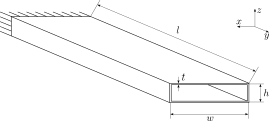

In [1]:
from IPython.display import SVG  # class to embed an SVG into the display
import os  # module with miscellaneous operating system interfaces

SVG(filename=os.path.join('resources', '04_BoxBeamGeometry.svg'))

Notice how the width $w$ and the height $h$ are measured from the thin walls' midplane. This is done to be consistent with our numerical model, where we'll use shell elements that have a symmetric thikness with respect to their midplane.

We define the geometric properties of our box beam with the aim of obtaining a scaled imitation of the Common Research Model (CRM, [Vassberg et al. 2008](https://arc.aiaa.org/doi/abs/10.2514/6.2008-6919)). For this reason we use an aspect ratio $2l/w=9$ and a non-dimensional height of $h/w=0.2$. For the wall thickness $t$ we use a $1/50$ ratio with respect to the height of the cross-section, in order to obtain a thin-walled structure. The width $w$ is set to $1$ m and the other dimensions follow from that.

In [2]:
AR = 9.   # aspect ratio - 2*l/w (the length of the box beam corresponds to half the span of the CRM wing)
w = 1e3   # width [mm]
l = AR*w/2  # length [mm]
non_dimensional_height = 0.2  # h/w
h = w*non_dimensional_height  # box height [mm]
non_dimensional_thickness = 1/50  # t/h
t = h*non_dimensional_thickness   # shell thickness [mm]
print(f'Box beam dimensions:\n- width: {w/1e3:.2f} m\n- length: {l/1e3:.2f} m\n- height: {h/1e3:.2f} m\n- wall thickness: {t:.2f} mm')

Box beam dimensions:
- width: 1.00 m
- length: 4.50 m
- height: 0.20 m
- wall thickness: 4.00 mm


Next we define the material properties of our box beam. We use the same values employed by [Brooks et al. (2018)](https://arc.aiaa.org/doi/10.2514/1.J056603) for the development of the undeflected CRM (uCRM).

In [3]:
rho = 2780e-12  # density [ton/mm^3]
E = 73.1e3  # Young's modulus [MPa]
nu = 0.3  # Poisson's ratio

Note that, similarly to our previous notebooks, we are going to use the _millimeter - newton - megapascal - ton_ system of units.

## Setup of the numerical model <a name="numerical-model"></a>

***

The first step to set up our numerical model consists in discretizing the geometry into quadrilateral shell elements. For this purpose we are going to use the function `mesh_box` from the `box_beam_utils` module, which includes useful functions to work with a Nastran model of a box beam. The function takes as input:
 - dimensions of the box;
 - target length of the shell elements;

and it returns:
 - array with the xyz coordinates of the nodes;
 - array with their connectivity information.

The function makes sure to always discretize each edge of the box with an odd number of nodes, which results in a better approximation of the buckling shape.

For illustration purposes, let's discretize our box beam into quadrilateral elements with a target lenght equal to the box's height, that is to say 200 mm, and let's visualize the discretized geometry.

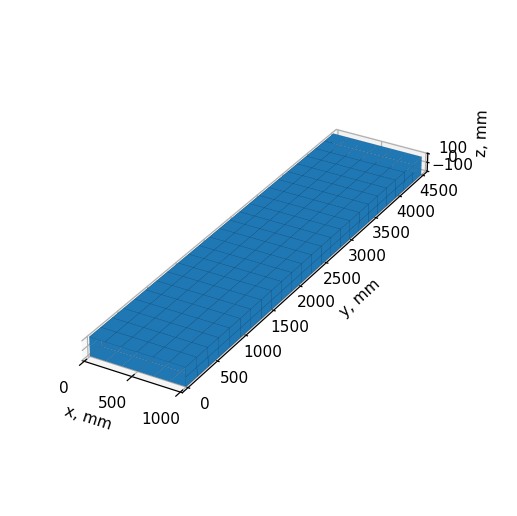

In [4]:
from resources import box_beam_utils  # module with useful function for box beam problems
import matplotlib.pyplot as plt  # plotting libary
import numpy as np  # arrays libary
from mpl_toolkits.mplot3d.art3d import Poly3DCollection  # class to create a collection of 3D polygons

# Discretize geometry
element_length = 200  # [mm]
nodes_coordinates_array, nodes_connectivity_matrix = box_beam_utils.mesh_box(width=w, length=l, height=h, element_length=element_length)

# Determine the number of elements and nodes per element
no_elements = np.size(nodes_connectivity_matrix, 0)
nodes_per_element = nodes_connectivity_matrix.shape[1]

# Initialize numpy array for vertices with appropriate shape
vertices = np.empty((no_elements, nodes_per_element, 3))  

# Find coordinates of the nodes for each element
for count, indices in enumerate(nodes_connectivity_matrix):  # iterate through the rows of the connectivity matrix (each row corresponds to a quadrilateral element)
    vertices[count] = nodes_coordinates_array[indices]  # store the coordinates of the nodes defining the current element

# Plot discretized geometry
plt.rcParams['figure.dpi'] = 110 # set default dpi of figures
fig = plt.figure(tight_layout=True)  # create new figure
ax = fig.add_subplot(111, projection='3d')  # create 3D axes
pc = Poly3DCollection(vertices, linewidths=.05)  # create 3D polygons representing the elements
pc.set_edgecolor('k')  # set polygons' edges black
ax.add_collection3d(pc)  # add polygons to the plot

# Set axes label
ax.set_xlabel("x, mm")
ax.set_ylabel("y, mm")
ax.set_zlabel("z, mm")

# Set axes limits
x_coords = vertices[..., 0].ravel()
y_coords = vertices[..., 1].ravel()
z_coords = vertices[..., 2].ravel()
ax.set_xlim(x_coords.min(), x_coords.max())
ax.set_ylim(y_coords.min(), y_coords.max())
ax.set_zlim(z_coords.min(), z_coords.max())

# Set aspect ratio of the axes
ax.set_box_aspect([ub - lb for lb, ub in (getattr(ax, f"get_{a}lim")() for a in 'xyz')])

# We define a function to adjust axes ticks and labels' position, that we'll also use later
def adjust_3d_plot(axes, colorbar=None):
    axes.locator_params(axis='x', nbins=3)  # set number of ticks of x-axis
    axes.locator_params(axis='z', nbins=2)  # set number of ticks of z-axis
    axes.tick_params(axis='y', which='major', pad=20)  # adjust position of ticks' label of y-axis
    axes.tick_params(axis='z', which='major', pad=6)  # adjust position of ticks' label of z-axis
    axes.yaxis.labelpad = 60  # adjust position of y-axis's label
    axes.zaxis.labelpad = 10  # adjust position of z-axis's label
    if colorbar is not None:
        colorbar.ax.set_position(colorbar.ax.get_position().shrunk(1.0, .66))  # decrease colorbar size
        colorbar.ax.set_position(colorbar.ax.get_position().translated(0, .14))  # move colorbar upwards

# Set axes ticks and labels' position and show plot
adjust_3d_plot(ax)
plt.show()

We can see that even if the prescribed element length is equal to the height of the box beam, our discretization function makes sure that the height of the box is discretized with at least three nodes and thus two elements.

Next we need to create a base Nastran input including material properties, element properties, nodes, `CQUAD4` elements, boundary conditions and some default options to set up the output files. We'll do this calling the function `create_base_bdf_input` from the `box_beam_utils` module. This function takes as input:
 - material properties;
 - wall thickness;
 - arrays obtained from the `mesh_box` function.

It returns a `BDF` object including the following cards:
 - `MAT1` to define an isotropic material;
 - `PSHELL` to define the properties of the shell elements;
 - `GRID` and `CQUAD4` to define nodes and quadrilateral shell elements, respectively;
 - `SPC1` to define the boundary conditions, corresponding to clamped nodes along the root section of the box beam;
 - `PARAM` cards and case control commands to set up the output files.

Let's create a bdf input using the discretization obtained earlier and let's print the cards included in it.

In [5]:
example_box_beam_input = box_beam_utils.create_base_bdf_input(young_modulus=E, poisson_ratio=nu, density=rho, shell_thickness=t, nodes_xyz_array=nodes_coordinates_array, nodes_connectivity_matrix=nodes_connectivity_matrix)
print(example_box_beam_input.get_bdf_stats())

---BDF Statistics---
SOL None

bdf.spcs[1]: 1
  SPC1:    1

bdf.params: 0
  PARAM    : 1

bdf.nodes: 0
  GRID     : 400

bdf.elements: 0
  CQUAD4   : 384

bdf.properties: 0
  PSHELL   : 1

bdf.materials: 0
  MAT1     : 1




subcase=0 already exists...skipping


## Uniform load over the top skin <a name="uniform-load"></a>

***

The first loading condition that we consider is a uniformly distributed load $P$ over the top skin, as shown below. This is meant to represent a surrogate of the aerodynamic load.

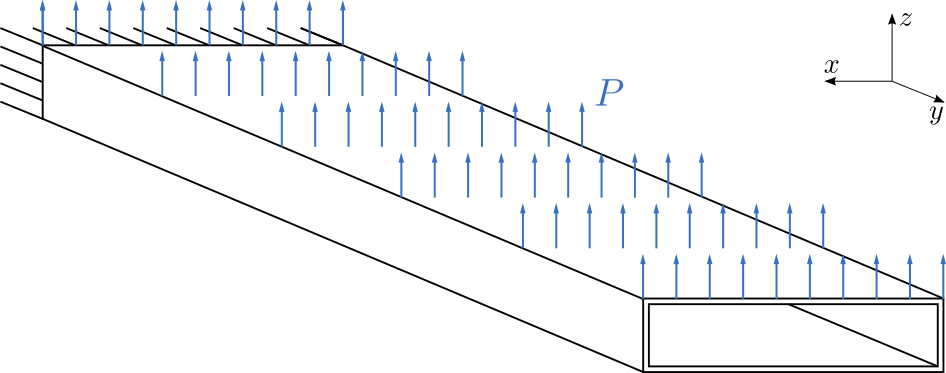

In [6]:
SVG(filename=os.path.join('resources', '04_BoxBeamDistributedLoad.svg'))

We define the function `apply_distributed_load_over_top_skin` to apply the described load. This function finds the ids of the top skin nodes and then calls the function `add_unitary_force` from the `pynastran_utils` module. This in turn adds a `FORCE` card defining a force along the $z$ axis to every node of the top skin, in such a way that the total applied load is 1 N. We do this to be able to easily scale the magnitude of the total applied load in our analyses.

In [7]:
from resources import pynastran_utils  # module with useful functions to work with pyNastran objects

FORCE_SET_ID = 11  # define FORCE card identification number

# Function to apply a distributed load over the top skin
def apply_distributed_load_over_top_skin(bdf_input, nodes_xyz_array):
    ids = np.arange(1, np.size(nodes_xyz_array, 0) + 1)  # retrieve id of all nodes
    top_skin_ids = ids[nodes_xyz_array[:, 2] == h/2]  # find id of nodes with z = h/2 (top skin nodes)
    pynastran_utils.add_unitary_force(bdf_object=bdf_input, nodes_ids=top_skin_ids, set_id=FORCE_SET_ID, direction_vector=[0, 0, 1])  # define unitary force along z over the top skin

### Mesh convergence study <a name="mesh-convergence"></a>

In order to establish an appropriate mesh size for our analyses, we need to perform a mesh convergence study. Since we want to study the buckling behavior of the box beam, we are going to evaluate the convergence of the mesh by monitoring the change of the linear buckling load predicted by SOL 105 as the mesh is refined. For this purpose we are going to use the function `run_sol_105_buckling_analysis` from the `pynastran_utils` module, which calculates the linear buckling load taking as input a `BDF` object. This functions performs the following steps:

- assign solution sequence 105 to the input `BDF` object;
- create the first subcase for the application of the static load. The function takes as input a set idenfitication number corresponding to the applied load. As a consequence, `apply_uniform_load_over_top_skin` has to be called before `run_sol_105_buckling_analysis` to define the applied load;
- add an `EIGRL` card to define the calculation of the first positive eigenvalue using the Lanczos method;
- create the second subcase for the calculation of the buckling load;
- write the input file and run the analysis;
- read the results in the op2 file and return the corresponding `OP2` object.

We can then find the critical buckling load by multiplying the applied load by the eigenvalue found by SOL 105. Since we apply a unitary load, the eigenvalue is going to correspond to the buckling load. Let's calculate and print the linear buckling load for the example model created earlier.

In [8]:
# Define name and path of analysis directory
analysis_directory_name = '04_Nonlinear_Buckling_Analysis_of_a_Box_Beam'
ANALYSIS_DIRECTORY_PATH = os.path.join(os.getcwd(), 'analyses', analysis_directory_name)  # constant throughout the notebook

# Apply uniform load to example bdf input
apply_distributed_load_over_top_skin(example_box_beam_input, nodes_coordinates_array)

# Run SOL 105 and return OP2 object
sol_105_op2 = pynastran_utils.run_sol_105_buckling_analysis(bdf_object=example_box_beam_input, static_load_set_id=FORCE_SET_ID,
                                                            analysis_directory_path=ANALYSIS_DIRECTORY_PATH,
                                                            input_name='linear_buckling_example', run_flag=False)

# Find critical buckling load and print it
eigenvalue_calculation_subcase_id = 2
linear_buckling_load = sol_105_op2.eigenvectors[eigenvalue_calculation_subcase_id].eigr
print(f'Buckling load: {linear_buckling_load:.0f} N')

Buckling load: 4097 N


We can also plot the critical buckling mode calling the function `plot_buckling_mode` from the `pynastran_utils` module and passing the `OP2` object as input argument.

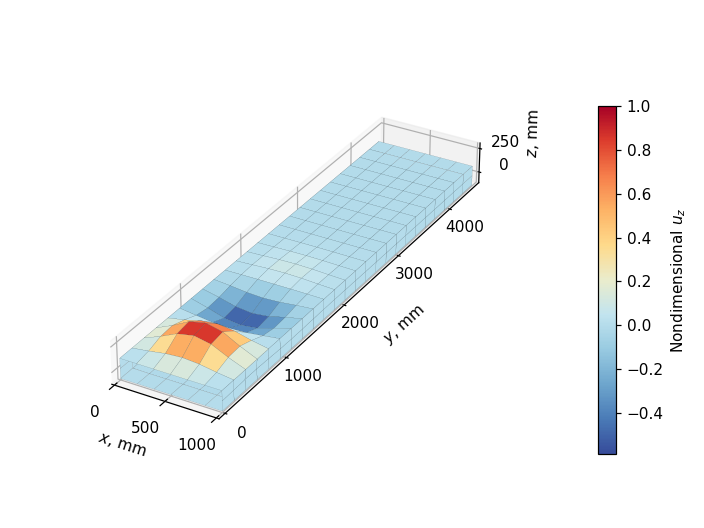

In [9]:
%matplotlib widget

_, ax, cbar = pynastran_utils.plot_buckling_mode(op2_object=sol_105_op2, subcase_id=eigenvalue_calculation_subcase_id,
                                                 displacement_component='tz', colormap='sunset')
adjust_3d_plot(ax, cbar)
plt.show()

Now we can run our mesh convergence study. We define 10 different linear sizes of the shell elements, evenly spaced on a log scale between half and 1/20 of the height of the box beam.

In [10]:
# Define shell elements' lengths to be used for the mesh convergence study and print them to screen
shell_element_lengths = np.geomspace(h/2, h/20, 10) # [mm]
print("Prescribed edge length of shell elements for mesh convergence study [mm]:")
np.set_printoptions(precision=0)
print(shell_element_lengths)

Prescribed edge length of shell elements for mesh convergence study [mm]:
[100.  77.  60.  46.  36.  28.  22.  17.  13.  10.]


For each shell element size we generate the bdf input, apply the load, run SOL 105, find the critical buckling load and plot the critical buckling mode. We also store the value of the buckling load, together with the number of elements and the number of degrees of freedom of the model.

subcase=0 already exists...skipping



Results of model with:
- 100 mm prescribed edge length
- 1104 elements
- 6624 degrees of freedom
Buckling load: 3932 N
Buckling mode:


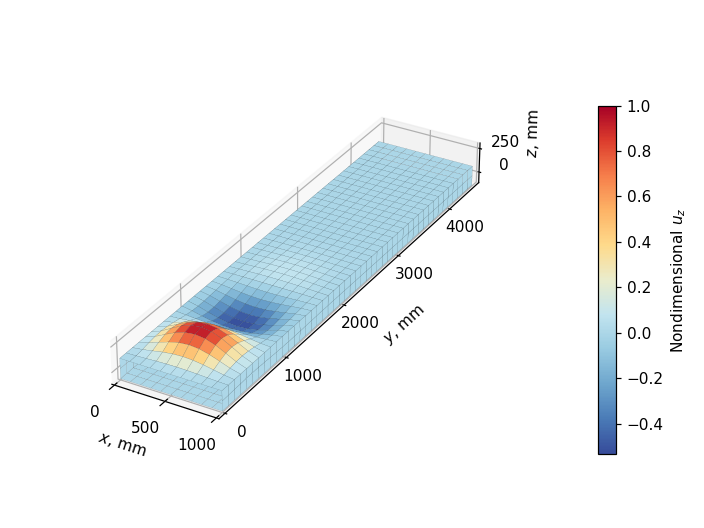

subcase=0 already exists...skipping



Results of model with:
- 77 mm prescribed edge length
- 2160 elements
- 12960 degrees of freedom
Buckling load: 3910 N
Buckling mode:


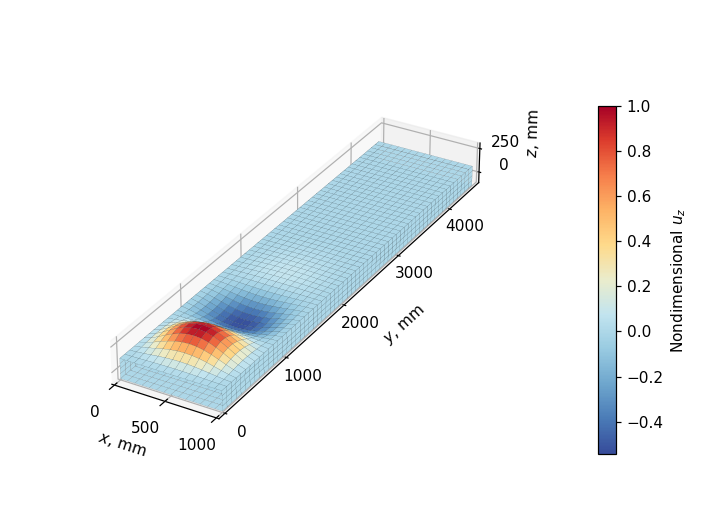

subcase=0 already exists...skipping


Nastran job distributed_load_linear_buckling_3344_elements.bdf completed
Wall time: 3.0 s



Results of model with:
- 60 mm prescribed edge length
- 3344 elements
- 20064 degrees of freedom
Buckling load: 3908 N
Buckling mode:


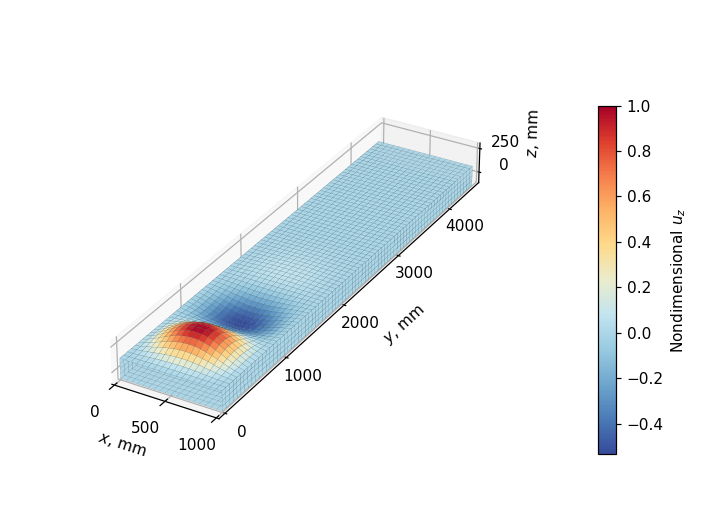

subcase=0 already exists...skipping


Nastran job distributed_load_linear_buckling_5488_elements.bdf completed
Wall time: 2.0 s



Results of model with:
- 46 mm prescribed edge length
- 5488 elements
- 32928 degrees of freedom
Buckling load: 3909 N
Buckling mode:


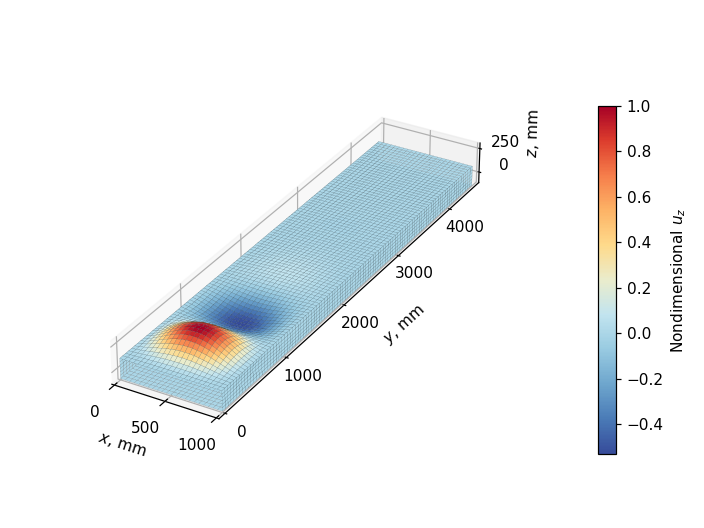

subcase=0 already exists...skipping


Nastran job distributed_load_linear_buckling_8568_elements.bdf completed
Wall time: 5.0 s



Results of model with:
- 36 mm prescribed edge length
- 8568 elements
- 51408 degrees of freedom
Buckling load: 3912 N
Buckling mode:


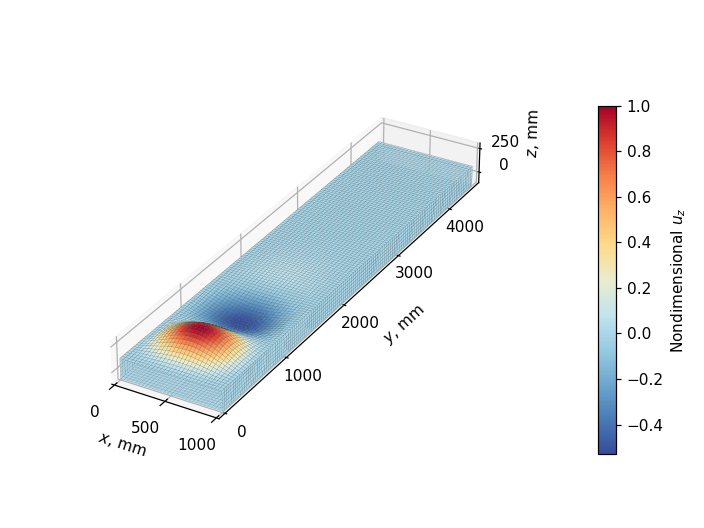

subcase=0 already exists...skipping


Nastran job distributed_load_linear_buckling_14256_elements.bdf completed
Wall time: 7.0 s



Results of model with:
- 28 mm prescribed edge length
- 14256 elements
- 85536 degrees of freedom
Buckling load: 3915 N
Buckling mode:


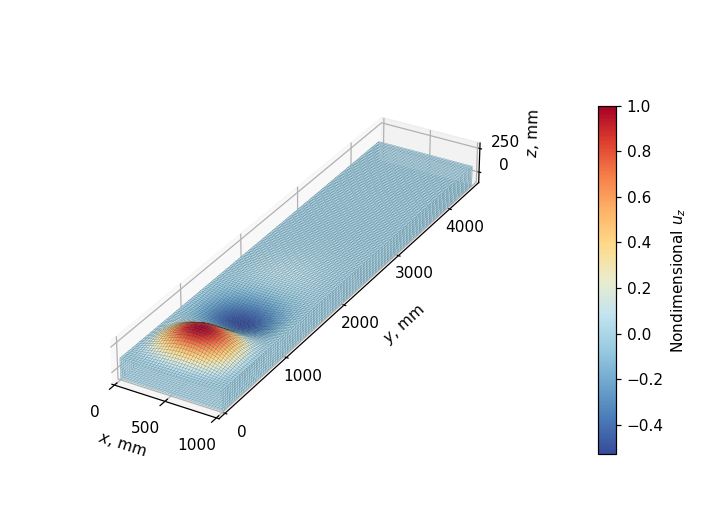

subcase=0 already exists...skipping


Nastran job distributed_load_linear_buckling_24360_elements.bdf completed
Wall time: 12.0 s



Results of model with:
- 22 mm prescribed edge length
- 24360 elements
- 146160 degrees of freedom
Buckling load: 3917 N
Buckling mode:


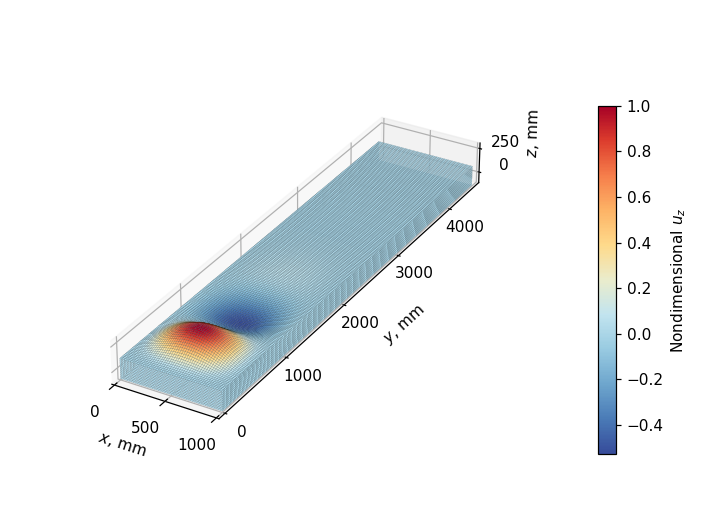

subcase=0 already exists...skipping


Nastran job distributed_load_linear_buckling_38880_elements.bdf completed
Wall time: 30.0 s



Results of model with:
- 17 mm prescribed edge length
- 38880 elements
- 233280 degrees of freedom
Buckling load: 3918 N
Buckling mode:


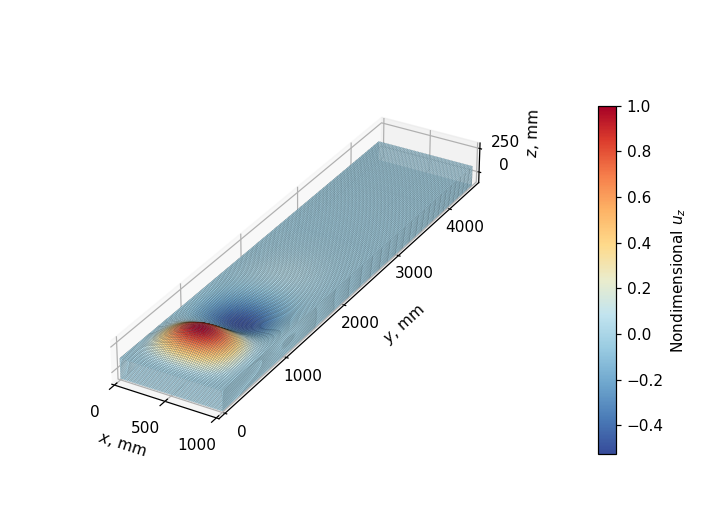

subcase=0 already exists...skipping


Nastran job distributed_load_linear_buckling_65800_elements.bdf completed
Wall time: 60.0 s



Results of model with:
- 13 mm prescribed edge length
- 65800 elements
- 394800 degrees of freedom
Buckling load: 3920 N
Buckling mode:


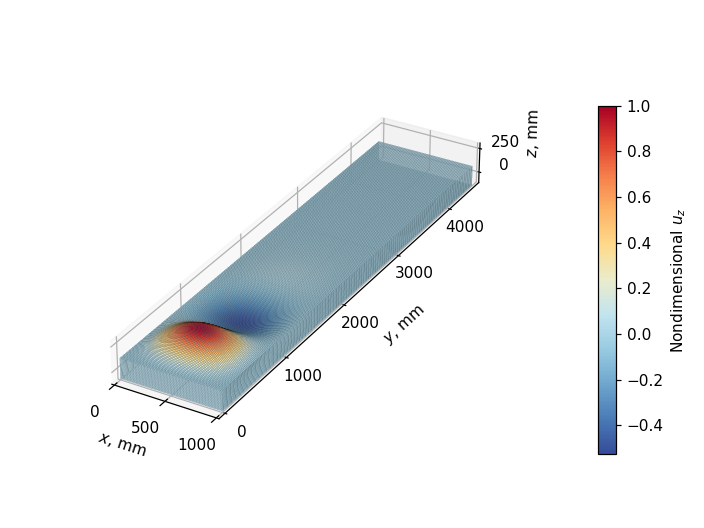

subcase=0 already exists...skipping


Nastran job distributed_load_linear_buckling_108000_elements.bdf completed
Wall time: 65.0 s



Results of model with:
- 10 mm prescribed edge length
- 108000 elements
- 648000 degrees of freedom
Buckling load: 3920 N
Buckling mode:


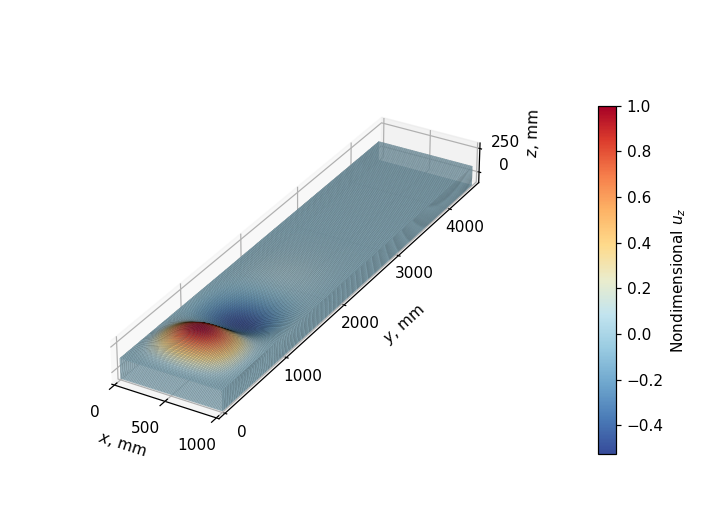

In [11]:
# Initialize arrays with number of elements, number of degrees of freedom and linear buckling loads
no_elements = np.empty(np.shape(shell_element_lengths), dtype=int)
dofs = np.empty(np.shape(shell_element_lengths), dtype=int)
linear_buckling_loads = np.empty(np.shape(shell_element_lengths))

# Iterate through the different edge lengths
for count, element_length in enumerate(shell_element_lengths):
    # Generate bdf input
    nodes_coordinates_array, nodes_connectivity_matrix = box_beam_utils.mesh_box(width=w, length=l, height=h, element_length=element_length)
    linear_buckling_bdf = box_beam_utils.create_base_bdf_input(young_modulus=E, poisson_ratio=nu, density=rho, shell_thickness=t,
                                                               nodes_xyz_array=nodes_coordinates_array,
                                                               nodes_connectivity_matrix=nodes_connectivity_matrix)
    # Store number of elements and number of degrees of freedom of current model
    no_elements[count] = len(linear_buckling_bdf.elements)
    constrained_nodes_ids = next(iter(linear_buckling_bdf.spcs.values()))[0].node_ids
    dofs[count] = (len(linear_buckling_bdf.nodes) - len(constrained_nodes_ids))*6
    # Apply uniform load over the top skin
    apply_distributed_load_over_top_skin(linear_buckling_bdf, nodes_coordinates_array)
    # Run SOL 105
    input_name = f"distributed_load_linear_buckling_{no_elements[count]:d}_elements"
    # Run SOL 105 and return OP2 object
    sol_105_op2 = pynastran_utils.run_sol_105_buckling_analysis(bdf_object=linear_buckling_bdf.__deepcopy__({}), static_load_set_id=FORCE_SET_ID,
                                                                analysis_directory_path=ANALYSIS_DIRECTORY_PATH, input_name=input_name,
                                                                run_flag=False)
    # Find critical buckling load and print it
    print(f"\n\033[1mResults of model with:\n- {element_length:.0f} mm prescribed edge length\n- {no_elements[count]:d} elements\n- {dofs[count]:d} degrees of freedom\033[0m")
    linear_buckling_loads[count] = sol_105_op2.eigenvectors[eigenvalue_calculation_subcase_id].eigr
    print(f"Buckling load: {linear_buckling_loads[count]:.0f} N")
    # Plot critical buckling mode
    print(f'Buckling mode:')
    _, ax, cbar = pynastran_utils.plot_buckling_mode(op2_object=sol_105_op2, subcase_id=eigenvalue_calculation_subcase_id, displacement_component='tz',
                                                     colormap='sunset')
    adjust_3d_plot(ax, cbar)
    plt.show()

Once we've run the linear buckling analysis for all element sizes, we can plot the results in terms of buckling loads against the number of degrees of freedom.

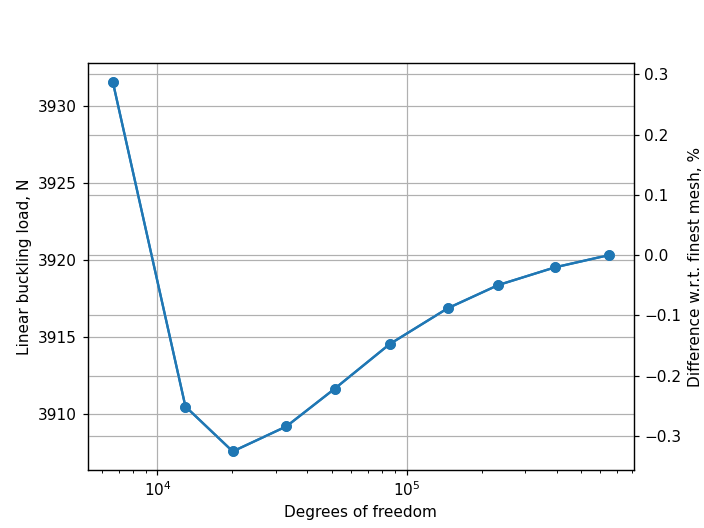

In [12]:
# Plot buckling loads vs degrees of freedom with a log scale along the x-axis
fig, ax1 = plt.subplots()  # create a figure and set of axes
buckling_load_line = ax1.semilogx(dofs, linear_buckling_loads, 'o-')

# Create a twin set of axes to show the percentage difference w.r.t. the finest mesh
ax2 = ax1.twinx()
percentage_diff = (linear_buckling_loads/linear_buckling_loads[-1]-1)*100
percentage_diff_line = ax2.plot(dofs, percentage_diff, 'o-')

# Set plot appearance
ax1.set_xlabel("Degrees of freedom")
ax1.set_ylabel("Linear buckling load, N")
ax2.set_ylabel("Difference w.r.t. finest mesh, %")
ax1.grid(True)
ax2.grid(True)
plt.show()


The plot shows that for all element sizes tested, the buckling load is within 0.3% of the value obtained with the finest mesh. This means that we can consider the buckling load converged even for the coarsest mesh, and this is also confirmed by the plots of the critical buckling mode. However, to choose the mesh size for our next analyses, we consider how the buckling load changes between successive meshes. For this reason we calculate the percentage difference of each buckling load with respect to the immediately coarser mesh and we plot it against the number of degrees of freedom.

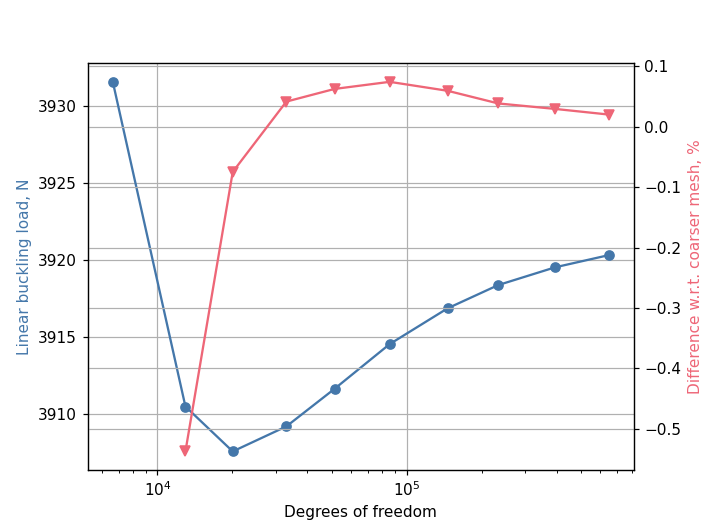

In [13]:
import tol_colors as tc  # package for colorblind-friendly colors

plt.rc('axes', prop_cycle=plt.cycler('color', list(tc.tol_cset('bright'))))  # set default color cycle to TOL bright for colorblind accessibility
colors = plt.rcParams["axes.prop_cycle"].by_key()["color"]  # retrieve list with default color cycle

# Plot buckling loads vs degrees of freedom with a log scale along the x-axis
fig, ax1 = plt.subplots()  # create a figure and set of axes
buckling_load_line = ax1.semilogx(dofs, linear_buckling_loads, 'o-')

# Create a twin set of axes to plot percentage difference vs degrees of freedom
ax2 = ax1.twinx()
percentage_diff = (linear_buckling_loads[1:]/linear_buckling_loads[0:-1]-1)*100  # calculate the percentage difference of each buckling load with respect to the one obtained with the coarser mesh
percentage_diff_line = ax2.plot(dofs[1:], percentage_diff, 'v-', color=colors[1])  # plot percentage difference vs degrees of freedom in a different color

# Set plot appearance
ax1.set_xlabel("Degrees of freedom")
ax1.set_ylabel("Linear buckling load, N", color=buckling_load_line[0].get_color())
ax2.set_ylabel("Difference w.r.t. coarser mesh, %", color=percentage_diff_line[0].get_color())
ax1.grid(True)
ax2.grid(True)
plt.show()

Also for the difference with respect to the coarser mesh, we observe that the variation is very small. We decide to define the mesh to be converged when the difference with respect to the coarser mesh is less than 0.1%.

In [14]:
threshold = .1  # threshold of percentage difference to consider the mesh converged
converged_mesh_index = next((i for i, val in enumerate(percentage_diff) if all(np.abs(subsequent_val) < threshold for subsequent_val in percentage_diff[i:])), None) + 1  # find index where the percentage difference is permanently below the threshold
converged_element_length = shell_element_lengths[converged_mesh_index]  # store the prescribed element length of converged mesh
linear_buckling_load = linear_buckling_loads[converged_mesh_index]  # store buckling load of converged mesh
print(
    f"""The mesh is converged for a target element length of {converged_element_length:.0f} mm, corresponidng to {no_elements[converged_mesh_index]:d} elements,
    {dofs[converged_mesh_index]:d} degrees of freedom and a linear buckling load of {linear_buckling_load:.0f} N.""")

The mesh is converged for a target element length of 60 mm, corresponidng to 3344 elements,
    20064 degrees of freedom and a linear buckling load of 3908 N.


### Nonlinear buckling method <a name="disrtibuted-load-flexible-tip"></a>

Now we want to analyze the buckling behavior of our box beam with SOL 106's nonlinear buckling method. We already explained and used this method for the calculation of the [buckling load of Euler's column](01_Buckling_Analysis_of_Euler_Column.ipynb#nonlinear-buckling). Here we want to investigate how the critical buckling load and mode change for different magnitudes of the applied load. In order to do this, we are going to define a sequence of subcases with increasing applied loads, where for each of these we calculate the critical buckling load and mode.

Let's create the base bdf input for our nonlinear analysis using the target shell element of the converged mesh and let's apply a distributed load to the top skin.

In [15]:
nodes_coordinates_array, nodes_connectivity_matrix = box_beam_utils.mesh_box(width=w, length=l, height=h, element_length=converged_element_length)  # disretize geometry
nonlinear_buckling_input = box_beam_utils.create_base_bdf_input(young_modulus=E, poisson_ratio=nu, density=rho, shell_thickness=t,
                                                                nodes_xyz_array=nodes_coordinates_array,
                                                                nodes_connectivity_matrix=nodes_connectivity_matrix)  # create base BDF object
apply_distributed_load_over_top_skin(nonlinear_buckling_input, nodes_coordinates_array)  # add distributed load to BDF object

subcase=0 already exists...skipping


Then we define the function `run_nonlinear_buckling_method_sweep` to set up and run SOL 106 using the nonlinear buckling method. Since we want to investigate increasing applied loads, we define this function so that it receives a list of applied load magnitudes as input, sets up the nonlinear analysis with the nonlienar buckling method, creates a subcase for each load magnitude and runs the analysis with Nastran.

The nonlinear analysis is set up by calling the function `set_up_arc_length_method` from the `pynastran_utils` module. This function selects SOL 106 as solution sequence, enables large displacement effects with the `PARAM,LGDISP,1` command, and adds the `NLPARM` and the `NLPCI` cards. For these cards we use the same parameters employed in our previous notebooks. Then `run_nonlinear_buckling_method_sweep` continues with the definition of the parameters for the buckling analysis, with the creation of the load sets and of the associated subcases. In this way the analysis calculates a buckling load for each subcase, and consequently for each applied load. Finally, the function runs the analysis, reads the op2 file and returns the `OP2` object.

In [16]:
from pyNastran.op2.op2 import read_op2  # function to read the op2 output of Nastran

# Function to set up the nonlinear analysis with the nonlinear buckling methods for increasing applied loads
def run_nonlinear_buckling_method_sweep(bdf_input, load_magnitudes, input_filename, run_flag=True):
    # Set up nonlinear analysis with arc-length method
    pynastran_utils.set_up_arc_length_method(bdf_object=bdf_input, ninc=100, max_iter=25, conv='PUV', eps_p=1e-3, eps_u=1e-3, max_bisect=10,
                                             minalr=.01, maxalr=1.0001, desiter=5, maxinc=1000)
    # Define parameters for buckling analysis
    bdf_input.add_param('BUCKLE', [2])
    eigrl_set_id = FORCE_SET_ID + 1
    bdf_input.add_eigrl(sid=eigrl_set_id, v1=0., nd=1)  # calculate only the first positive eigenvalue
    bdf_input.case_control_deck.subcases[0].add_integer_type('METHOD', eigrl_set_id)
    # Create the LOAD cards corresponding to the input load magnitudes and the associated subcases
    for i, scale_factor in enumerate(load_magnitudes):
        load_set_id = 21+i
        bdf_input.add_load(sid=load_set_id, scale=1., scale_factors=[scale_factor], load_ids=[FORCE_SET_ID])
        pynastran_utils.create_static_load_subcase(bdf_object=bdf_input, subcase_id=i+1, load_set_id=load_set_id)
    # Run analysis
    pynastran_utils.run_analysis(directory_path=ANALYSIS_DIRECTORY_PATH, bdf_object=bdf_input, filename=input_filename, run_flag=run_flag)
    # Read op2 file
    op2_filepath = os.path.join(ANALYSIS_DIRECTORY_PATH, input_filename + '.op2')
    op2 = read_op2(op2_filename=op2_filepath, load_geometry=True, debug=None)
    # Return op2 object
    return op2

We define 4 different subcases with increasing applied loads. These are evenly spaced between 1 N and the linear buckling load predicted by SOL 105, so 3908 N. We consider only 1 N for the first subcase because we want to verify the behavior of SOL 106's nonlinear buckling method when the structure is deformed only slightly and thus it is very close to its undeformed state. For this situation, we expect SOL 106 to predict a buckling load very close to the one predicted by SOL 105.

In [17]:
applied_load_magnitudes = np.linspace(1, linear_buckling_load, 4)
np.set_printoptions(precision=0, suppress=True)
print(f"Applied loads [N]: {applied_load_magnitudes}")

Applied loads [N]: [   1. 1303. 2605. 3908.]


We define the input name of our analysis and we call the `run_nonlinear_buckling_method_sweep` function.

In [18]:
input_name = 'distributed_load_flexible_tip_nonlinear_buckling_method'
sol_106_op2 = run_nonlinear_buckling_method_sweep(nonlinear_buckling_input, applied_load_magnitudes, input_name, run_flag=False)

Nastran job distributed_load_flexible_tip_nonlinear_buckling_method.bdf completed
Wall time: 392.0 s


Now we want to plot the buckling loads predicted by SOL 106, $P_\text{SOL 106}$, and the critical buckling factors $\alpha$ against the applied loads $P$. We define a function to do so and we nondimensionalize all loads with the buckling load predicted by SOL 105, $P_\text{SOL 105}$. Since [Lee & Herting (1985)](https://onlinelibrary.wiley.com/doi/pdf/10.1002/nme.1620211016) suggested not to consider the predictions to be reliable for a value of $\alpha$ greater than unity, in the $\alpha - P/P_\text{SOL 105}$ plot we also draw the $\alpha=1$ line to verify the reliability of the prediction.

In [19]:
# Function to plot SOL 106 buckling loads and critical buckling factors against applied loads
def plot_buckling_loads(applied_loads, sol_105_buckling_load, sol_106_buckling_loads, alphas):
    _, axs = plt.subplots(nrows=2, ncols=1, sharex='all')  # figure with 2 subplots
    axs[0].plot(applied_loads/sol_105_buckling_load, sol_106_buckling_loads/sol_105_buckling_load, '-o')  # buckling loads vs applied loads
    axs[1].plot(applied_loads/sol_105_buckling_load, alphas, 'o')  # critical buckling factors vs applied loads
    axs[1].axhline(y=1, color='k', ls='--', label='$\\alpha=1$')  # alpha=1 reference line
    # Set plot appearance
    axs[0].set_ylabel('$P_\mathrm{SOL\/106}/P_\mathrm{SOL\/105}$')
    axs[0].grid(visible=True)
    axs[1].set_ylabel('$\\alpha$')
    axs[1].grid(visible=True)
    axs[1].legend()
    axs[1].set_xlabel('$P/P_\mathrm{SOL\/105}$')
    axs[1].set_ylim([0, np.median(alphas)])  # set the y-axis upper limit to the median of the critical buckling factors to avoid very large values to spoil the plot
    plt.show()

Now let's find the nonlinear buckling load and the critical buckling factor for each subcase using the function `read_nonlinear_buckling_load_from_f06` from the `pynastran_utils` module and let's plot our results. The nonlinear buckling load is returned by the function as an array with dimensions _(number of subcases, number of nodes, 6)_, where 6 indicates the forces and moments along the 3 axes. To get a representative nonlinear buckling load magnitude for each subcase, we need to take the sum of the forces over all nodes for each component and then take the norm of the resulting vector.

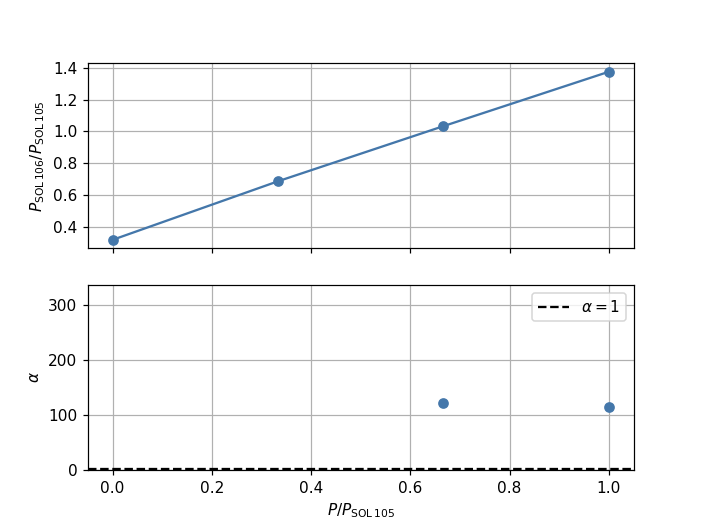

In [20]:
nonlinear_buckling_load_vectors, critical_buckling_factors = pynastran_utils.read_nonlinear_buckling_load_from_f06(
    f06_filepath=os.path.join(ANALYSIS_DIRECTORY_PATH, input_name + '.f06'), op2_object=sol_106_op2)  # read buckling loads and critical buckling factors from f06 file
nonlinear_buckling_loads = np.linalg.norm(np.sum(nonlinear_buckling_load_vectors[:, :, 0:3], axis=1), axis=1)  # calculate the norm of the nonlinear buckling load vector for each subcase
plot_buckling_loads(applied_load_magnitudes, linear_buckling_load, nonlinear_buckling_loads, critical_buckling_factors)

Note that when we don't see a point in the $\alpha$ plot, it means that the value fot that subcase is out of scale with respect to the range chosen for the display of the plot.

Finally, for each subcase we also plot the nonlinear deformation of the structure and the predicted buckling shape. We define an appropriate function for each task.

Applied load: 1 N
Nonlinear deformation:


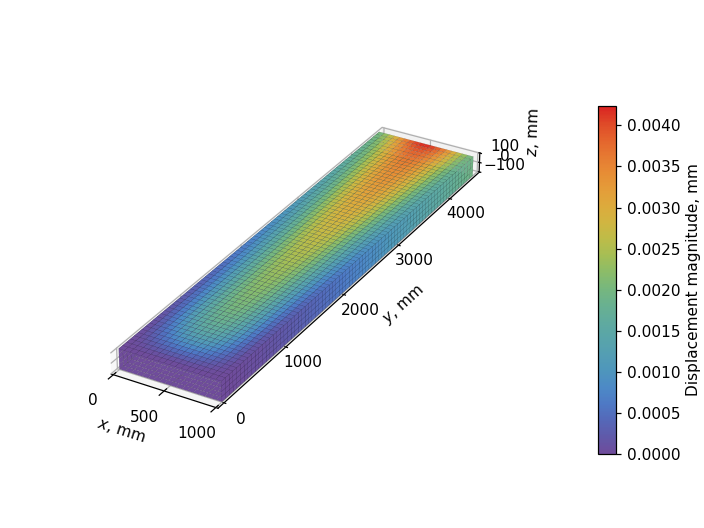

Predicted buckling load: 1252 N
Buckling shape:


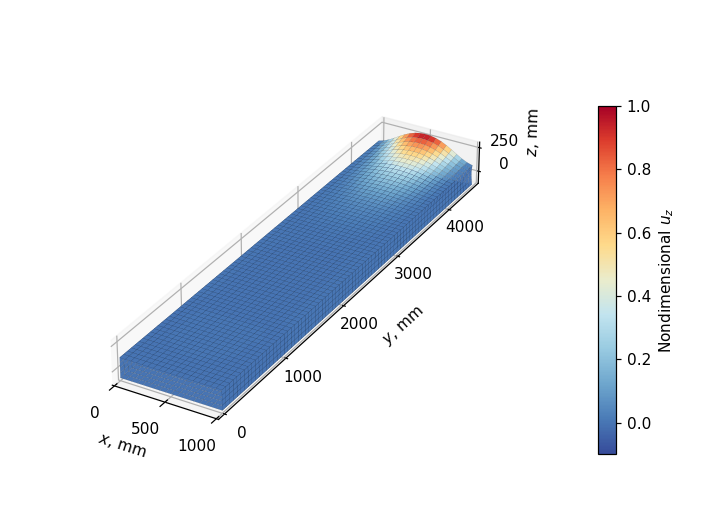

Applied load: 1303 N
Nonlinear deformation:


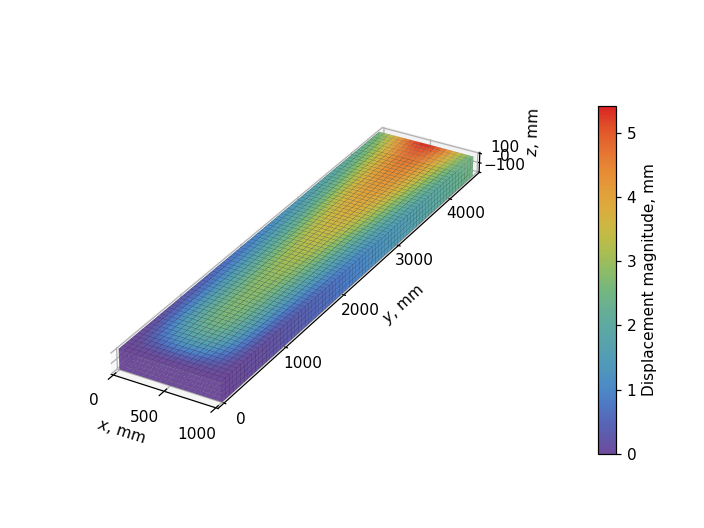

Predicted buckling load: 2687 N
Buckling shape:


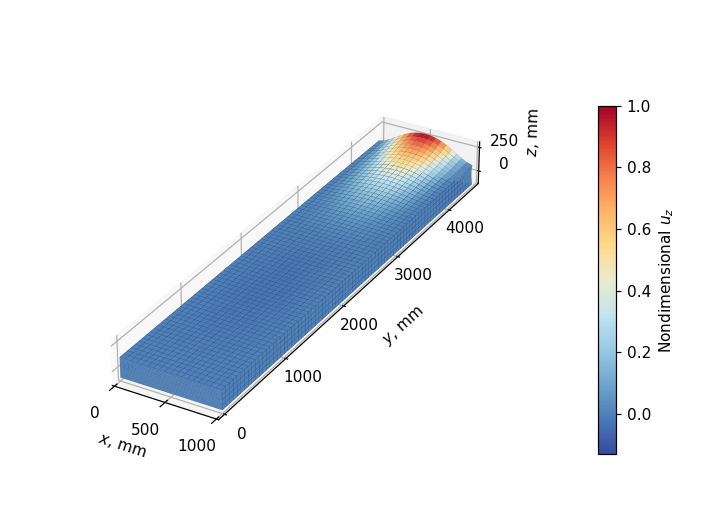

Applied load: 2605 N
Nonlinear deformation:


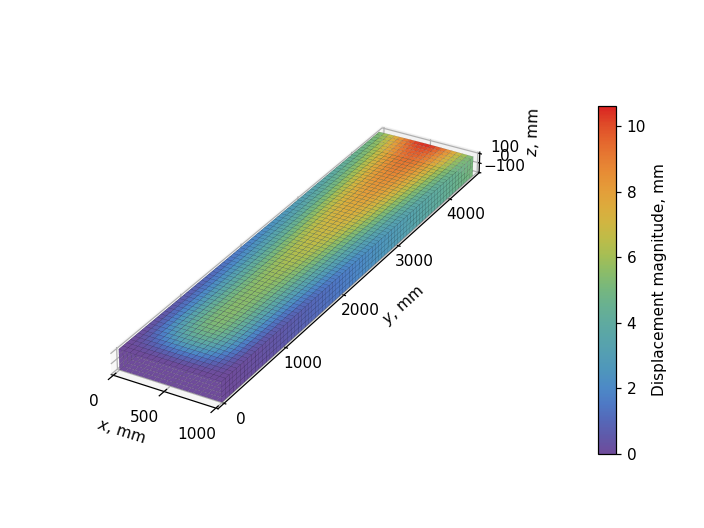

Predicted buckling load: 4037 N
Buckling shape:


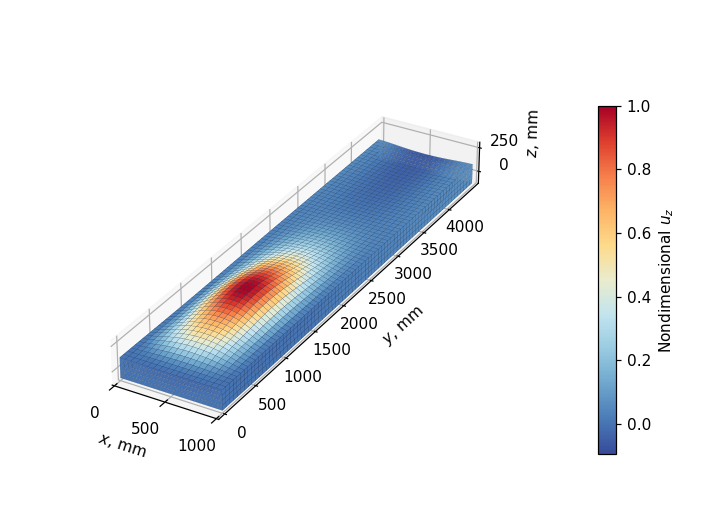

Applied load: 3908 N
Nonlinear deformation:


c:\Users\qa21944\Github\phd-jupyter-notebooks\notebooks\resources\pynastran_utils.py:262: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure()


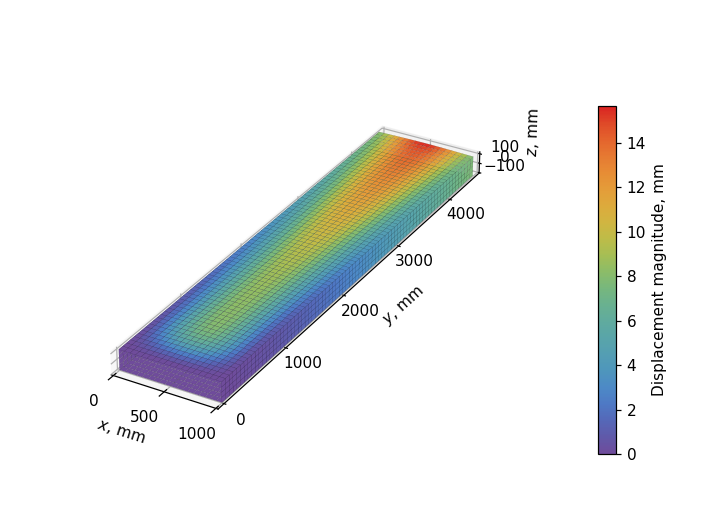

Predicted buckling load: 5370 N
Buckling shape:


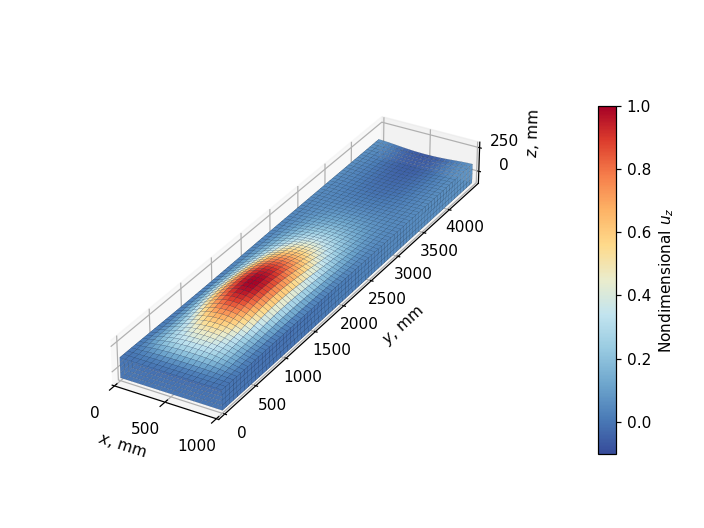

In [21]:
def plot_static_deformation(op2, subcase_id):
    # Call function from pynastran_utils module
    _, axes, colorbar = pynastran_utils.plot_static_deformation(op2_object=op2, subcase_id=subcase_id)
    # Adjust axes' ticks and labels' position
    adjust_3d_plot(axes, colorbar)
    # Show plot
    plt.show()

def plot_buckling_mode(op2, subcase_id):
    # Call function from pynastran_utils module
    _, axes, colorbar = pynastran_utils.plot_buckling_mode(op2_object=op2, subcase_id=subcase_id, displacement_component='tz', colormap='sunset')
    # Adjust axes' ticks and labels' position
    adjust_3d_plot(axes, colorbar)
    # Show plot
    plt.show()

# Plot displacements and buckling shape for each subcase
valid_displacements_keys = [subcase_id for subcase_id in sol_106_op2.displacements if hasattr(sol_106_op2.displacements[subcase_id], 'lftsfqs')]  # find valid keys associated to the subcases
eigenvector_keys = [subcase_id for subcase_id in sol_106_op2.eigenvectors]  # find keys associated to the eigenvectors of the valid subcases
for count, applied_load in enumerate(applied_load_magnitudes):  # iterate through the prescribed load magnitudes (each corresponding to a different subcase)
    print(f'\033[1mApplied load: {applied_load:.0f} N\033[0m\nNonlinear deformation:')  # print info on the subcase
    plot_static_deformation(sol_106_op2, valid_displacements_keys[count])  # plot static deformation at the end of the subcase
    print(f'Predicted buckling load: {nonlinear_buckling_loads[count]:.0f} N\nBuckling shape:')
    plot_buckling_mode(sol_106_op2, eigenvector_keys[count])  # plot buckling shape predicted by nonlinear buckling method for the applied load of current subcase

Some observation can be made looking at the results.
- The critical buckling factor $\alpha$ is consistently above 1 by at least two orders of magnitude, meaning that we should not trust the validity of the results obtained here.
- The nonlinear buckling load appears to have a linear relationship with the applied load and does not seem to converge to a certain value.
- The nonlinear buckling load for an applied load of 1 N is considerably smaller than the linear buckling load and this differs from our expectations. In fact, given its small deformation, the structure is very close to its undeformed state and, consequently, it would be reasonable to expect a predicted buckling load similar to the one predicted by the linear analysis, which accounts only for the undeformed state of the structure. It is unclear why this happens, so further investigation is needed.
- The displacement field obtained from the nonlinear analysis is analogous for all applied loads and presents a peak of the displacement magnitude at the tip of the top skin. Since there is no rib to reinforce the sections of the box beam, the skin is relatively flexible and gets pulled out-of-plane by the distributed load. This behavior is evidently different from a classic global beam-like deformation where the sections of the beam stay substantially undeformed. The magnitude of the displacement peak suggests a linear behavior of the structure for the range of the applied loads investigated.
- Despite the analogous displacement fields resulting from the nonlinear analyses, the critical buckling mode appears to change with the magnitude of the applied load. For smaller load magnitudes the critical buckling mode involves only the tip of the box beam, while for larger load magnitudes the displacement peak is located more inboard, resembling sligthly more the shape predicted by the linear buckling analysis. As a consequence, it appears that for small loads the buckling mode is more influenced by the local displacement of the top skin at the tip of the box beam, while for large loads the buckling mode is less influenced by that and resembles more the shape that would be expected for a structure having a global beam-like behavior.

### Rigid tip section <a name="distributed-load-rigid-tip"></a>

Let's try now to limit the out-of-plane displacement of the top skin in the tip region, that we observed in the last nonlinear analysis. For this purpose, we are going to constrain the tip section of the box beam and make it rigid, keeping the same type of distributed load employed earlier.

We define a new base `BDF` object, apply the distributed load over the top skin and add a master node at the center of the tip section. We then add a `RBE2` element that constrains all the nodes along the tip section to the master node, making the section rigid.

In [22]:
# Create base BDF object and apply distributed load over the top skin
rigid_tip_section_input = box_beam_utils.create_base_bdf_input(young_modulus=E, poisson_ratio=nu, density=rho, shell_thickness=t,
                                                               nodes_xyz_array=nodes_coordinates_array, nodes_connectivity_matrix=nodes_connectivity_matrix)
apply_distributed_load_over_top_skin(rigid_tip_section_input, nodes_coordinates_array)

# Add master node of tip section
master_node_id = np.size(nodes_coordinates_array, 0) + 1
rigid_tip_section_input.add_grid(master_node_id, [w/2, l, 0.])

# Add RBE2 element to make tip section rigid
nodes_ids = np.arange(1, np.size(nodes_coordinates_array, 0) + 1)
tip_nodes_ids = nodes_ids[nodes_coordinates_array[:,1]==l]
rbe2_eid = len(rigid_tip_section_input.elements) + 1
rigid_tip_section_input.add_rbe2(rbe2_eid, master_node_id, '123456', tip_nodes_ids)

subcase=0 already exists...skipping


RBE2        3345    3389  123456      77     154     231     308     385
             462     539     616     693     770     847     924    1001
            1078    1155    1232    1309    1386    1463    1540    1617
            1694    1771    1848    1925    2002    2079    2156    2233
            2310    2387    2464    2541    2618    2695    2772    2849
            2926    3003    3080    3157    3234    3311    3388

We run a linear buckling analysis to check whether the predicted critical buckling load and mode experience any change with respect to the configuration with a flexible tip section.

Nastran job distributed_load_rigid_tip_linear_buckling.bdf completed
Wall time: 3.0 s


Buckling load: 3908 N
Buckling mode:


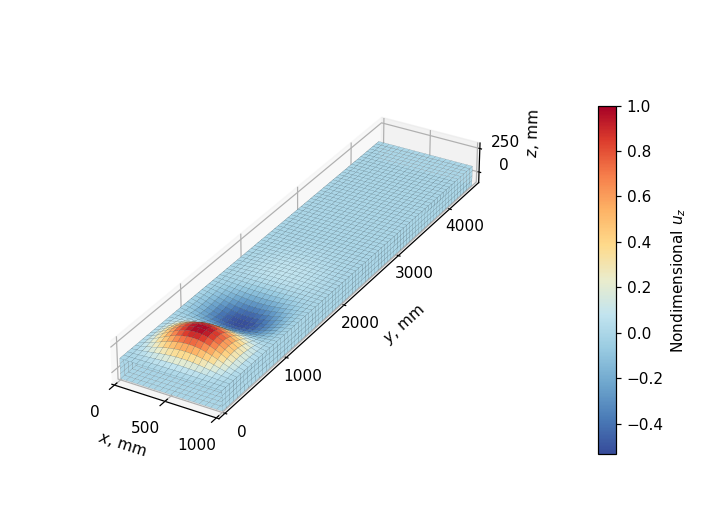

In [23]:
# Run SOL 105 and return OP2 object
sol_105_op2 = pynastran_utils.run_sol_105_buckling_analysis(bdf_object=rigid_tip_section_input.__deepcopy__({}), static_load_set_id=FORCE_SET_ID,
                                                            analysis_directory_path=ANALYSIS_DIRECTORY_PATH,
                                                            input_name='distributed_load_rigid_tip_linear_buckling', run_flag=False)

# Find critical buckling load and print it
linear_buckling_load = sol_105_op2.eigenvectors[eigenvalue_calculation_subcase_id].eigr
print(f"Buckling load: {linear_buckling_load:.0f} N")

# Plot critical buckling mode
print("Buckling mode:")
plot_buckling_mode(sol_105_op2, eigenvalue_calculation_subcase_id)

We can observe that both the critical buckling load and mode do not experience any change. The reason for this has to be found in the fact that the linear buckling analysis considers the structure in its undeformed state only and as a consequence it is not able to catch any difference between a flexible and a rigid tip section.

Now we switch to the nonlinear buckling analysis and we apply the same sequence of loads that we used for the flexible tip configuration.

Nastran job distributed_load_rigid_tip_nonlinear_buckling_method.bdf completed
Wall time: 394.0 s


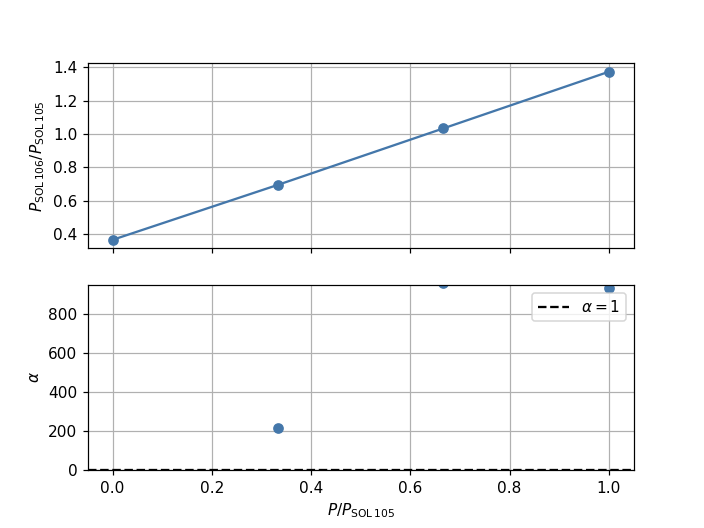

Applied load: 1 N
Nonlinear deformation:


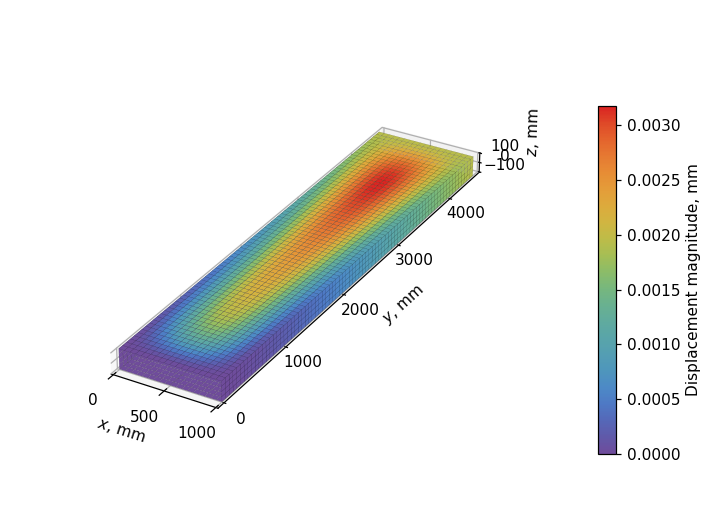

Predicted buckling load: 1435 N
Buckling shape:


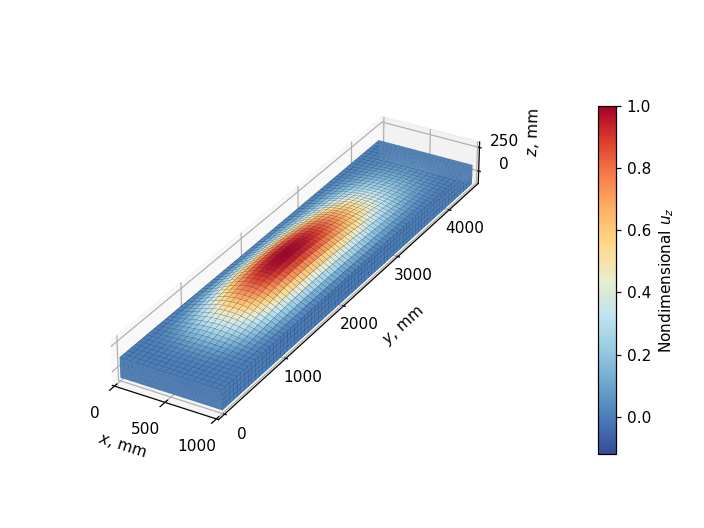

Applied load: 1303 N
Nonlinear deformation:


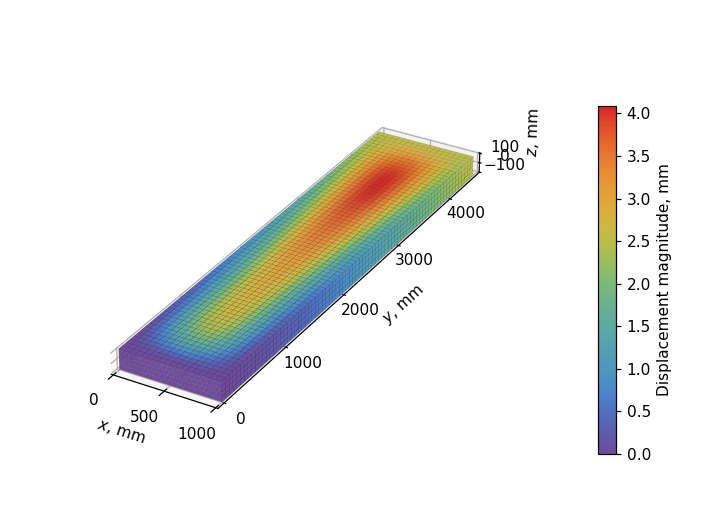

Predicted buckling load: 2720 N
Buckling shape:


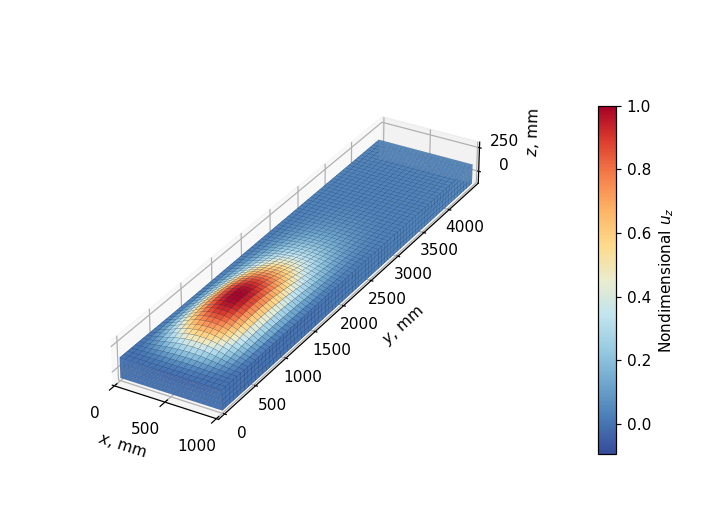

Applied load: 2605 N
Nonlinear deformation:


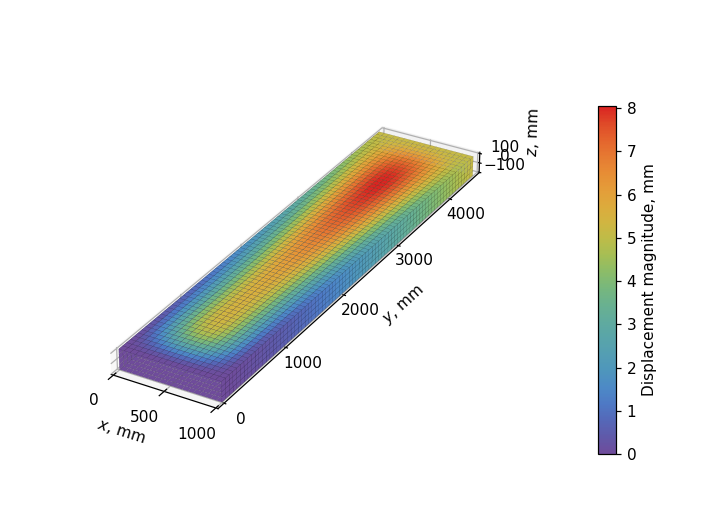

Predicted buckling load: 4039 N
Buckling shape:


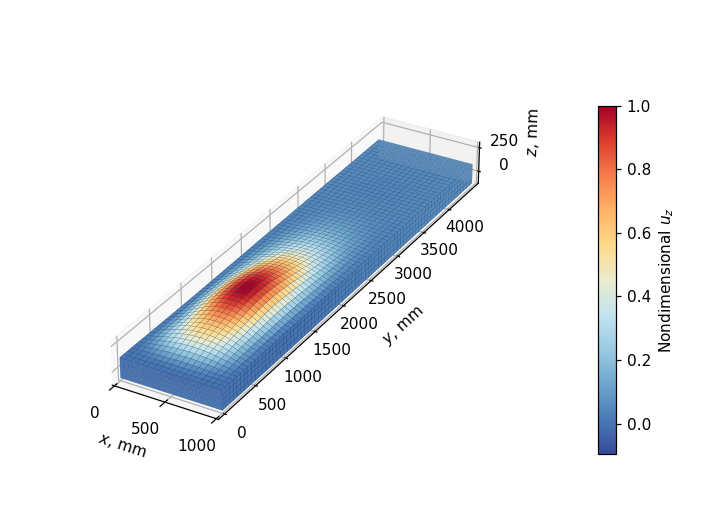

Applied load: 3908 N
Nonlinear deformation:


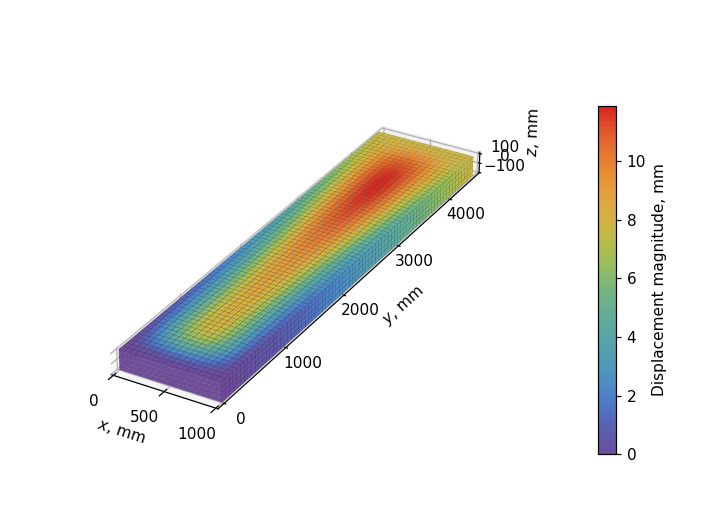

Predicted buckling load: 5362 N
Buckling shape:


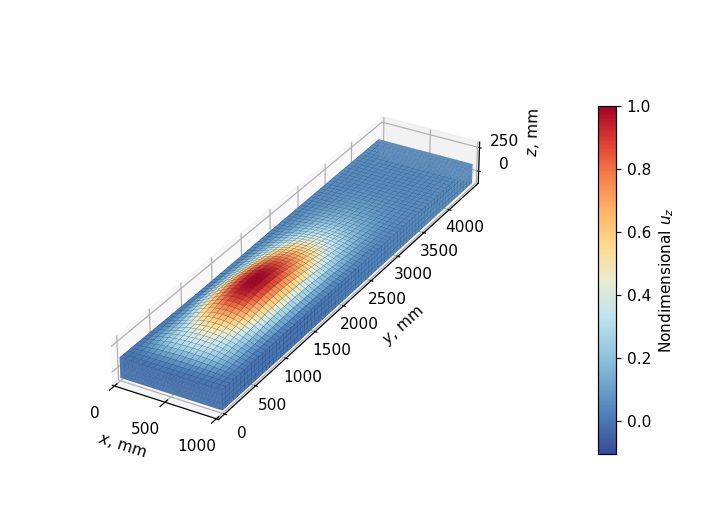

In [24]:
# Run nonlinear analysis
input_name = 'distributed_load_rigid_tip_nonlinear_buckling_method'
sol_106_op2 = run_nonlinear_buckling_method_sweep(rigid_tip_section_input, applied_load_magnitudes, input_name, run_flag=False)

# Find nonlinear buckling loads and critical buckling factors
nonlinear_buckling_load_vectors, critical_buckling_factors = pynastran_utils.read_nonlinear_buckling_load_from_f06(
    f06_filepath=os.path.join(ANALYSIS_DIRECTORY_PATH, input_name + '.f06'), op2_object=sol_106_op2)  # read buckling loads and critical buckling factors from f06 file
nonlinear_buckling_loads = np.linalg.norm(np.sum(nonlinear_buckling_load_vectors[:, :, 0:3], axis=1), axis=1)  # calculate the norm of the nonlinear buckling load vector for each subcase

# Plot results
plot_buckling_loads(applied_load_magnitudes, linear_buckling_load, nonlinear_buckling_loads, critical_buckling_factors)

# Plot displacements and buckling shape for each subcase
valid_displacements_keys = [subcase_id for subcase_id in sol_106_op2.displacements if hasattr(sol_106_op2.displacements[subcase_id], 'lftsfqs')]  # find valid keys associated to the subcases
eigenvector_keys = [subcase_id for subcase_id in sol_106_op2.eigenvectors]  # find keys associated to the eigenvectors of the valid subcases
for count, applied_load in enumerate(applied_load_magnitudes):  # iterate through the prescribed load magnitudes (each corresponding to a different subcase)
    print(f'\033[1mApplied load: {applied_load:.0f} N\033[0m\nNonlinear deformation:')  # print info on the subcase
    plot_static_deformation(sol_106_op2, valid_displacements_keys[count])  # plot static deformation at the end of the subcase
    print(f'Predicted buckling load: {nonlinear_buckling_loads[count]:.0f} N\nBuckling shape:')
    plot_buckling_mode(sol_106_op2, eigenvector_keys[count])  # plot buckling shape predicted by nonlinear buckling method for the applied load of current subcase

Once again the critical buckling factor is largely above 1, suggesting that the obtained results should not be trusted. Also the buckling loads results are analogous to the flexible tip configuration, with an apparent linear behavior with the applied loads.

Looking at the nonlinear deformation plots, we can observe that with the rigid tip section, the displacement peak has moved sligthly more inboard with respect to what we found for the flexible tip configuration. In fact, if on one hand the rigid tip section eliminates the out-of-plane displacement of the top skin at the very tip of the box beam, we can still observe such behavior almost all over the length. Clearly, more rigid sections or the introduction of some ribs are needed to obtain a displacement field resembling a global beam-like kind of deformation.

Nevertheless, the presence of the rigid tip section seems to have a substantial effect on the buckling shape. In fact, there is no local buckling mode at the tip for small loads, in contrast to what was found for the flexible tip configuration. The displacement peak is located approximately at half the length of the box beam for an applied load of 1 N, while it moves more towards the root for larger loads. The buckling shape for large loads is similar to the one obtained with the flexible tip configuration. As a consequence it can be stated that the rigid tip section has a substantial influence on the nonlinear buckling prediction only for small applied loads.



## Concentrated load at the tip <a name="concentrated-load"></a>

***

Now we are going to change the type of load applied on our box beam. Instead of a distributed load over the top skin, we are going to load the structure with a concentrated force applied at the center of the tip section. We are going to investigate the response to this load with both a flexible and a rigid tip section.

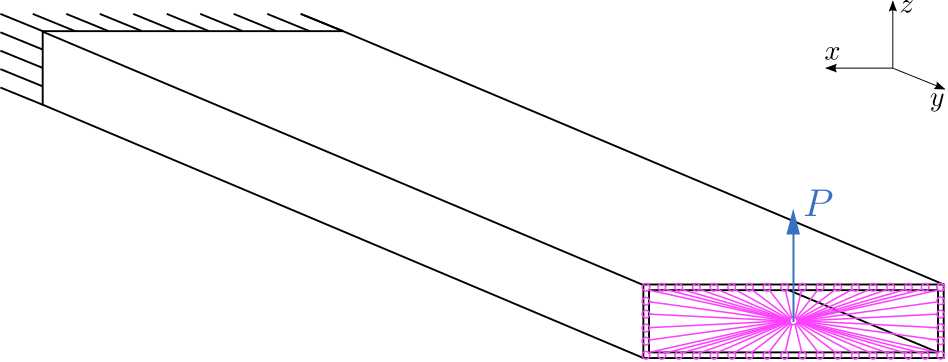

In [25]:
SVG(filename=os.path.join('resources', '04_BoxBeamConcentratedLoad.svg'))

### Flexible tip section <a name="concentrated-load-flexible-tip"></a>
Let's start by applying the concetrated load to a box beam with a flexible tip section. Similarly to the previous case with a rigid section, we create a base `BDF` object and we add a master node at the center of the tip section. This time we add a `RBE3` element to connect the nodes of the section to the master node. This element allows us to introduce a force at the master node and to distribute it to the nodes of the tip section, where the motion of the master node is defined as a weighted average of the motions of the connected nodes. Finally, we add a concentrated upward force of 1 N at the master node using a `FORCE` card.

In [26]:
concentrated_load_flexible_tip_input = box_beam_utils.create_base_bdf_input(young_modulus=E, poisson_ratio=nu, density=rho, shell_thickness=t,
                                                                            nodes_xyz_array=nodes_coordinates_array,
                                                                            nodes_connectivity_matrix=nodes_connectivity_matrix)  # base BDF input

# Add RBE3 element to apply concentrated load at the master node
concentrated_load_flexible_tip_input.add_grid(master_node_id, [w/2, l, 0.])  # add master node of tip section
rbe3_eid = rbe2_eid  # identification number of RBE3 element
concentrated_load_flexible_tip_input.add_rbe3(eid=rbe3_eid, refgrid=master_node_id, refc='123456', weights=[1.]*len(tip_nodes_ids),
                                              comps=['123456']*len(tip_nodes_ids), Gijs=tip_nodes_ids)  # add RBE3 card

# Add concentrated force
concentrated_force_magnitude = 1.
concentrated_force_direction = [0., 0., 1.]
concentrated_load_flexible_tip_input.add_force(sid=FORCE_SET_ID, node=master_node_id, mag=concentrated_force_magnitude,
                                               xyz=concentrated_force_direction)

subcase=0 already exists...skipping


FORCE         11    3389              1.      0.      0.      1.

Once again we calculate the linear buckling load and the corresponding mode.

Nastran job concentrated_load_flexible_tip_linear_buckling.bdf completed
Wall time: 2.0 s


Buckling load: 1654 N
Buckling mode:


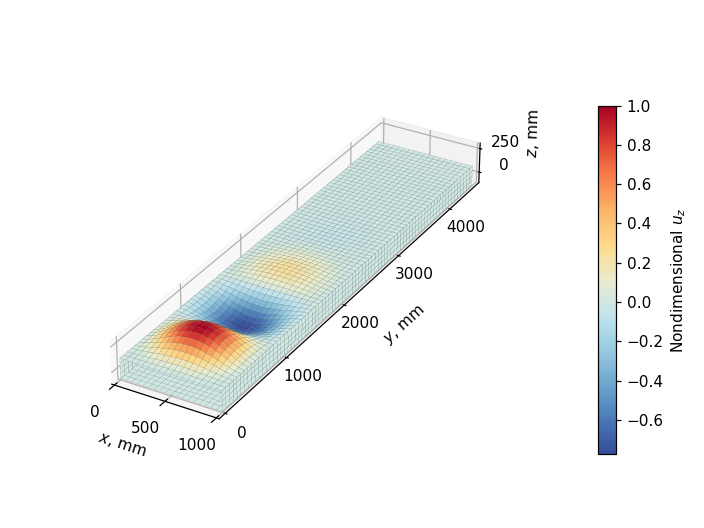

In [27]:
# Run SOL 105 and return OP2 object
sol_105_op2 = pynastran_utils.run_sol_105_buckling_analysis(bdf_object=concentrated_load_flexible_tip_input.__deepcopy__({}),
                                                            static_load_set_id=FORCE_SET_ID, analysis_directory_path=ANALYSIS_DIRECTORY_PATH,
                                                            input_name='concentrated_load_flexible_tip_linear_buckling', run_flag=False)

# Find critical buckling load and print it
linear_buckling_load = sol_105_op2.eigenvectors[eigenvalue_calculation_subcase_id].eigr
print(f'Buckling load: {linear_buckling_load:.0f} N')

# Plot critical buckling mode
print(f'Buckling mode:')
plot_buckling_mode(sol_105_op2, eigenvalue_calculation_subcase_id)

The predicted critical buckling mode is similar to the case with a distributed load. The buckling load is instead smaller, as expected. In fact, since the force is only applied at the tip of the box beam, the effective moment arm with respect to the root is larger than the one of the distributed load case. As a consequence, a smaller force is needed to induce buckling in the top skin.

Once again we run our nonlinear analysis applying 4 different load magnitudes, this time evenly distributed between 1 N and 1654 N.

Applied loads [N]: [   1.  552. 1103. 1654.]
Nastran job concentrated_load_flexible_tip_nonlinear_buckling_method.bdf completed
Wall time: 403.0 s


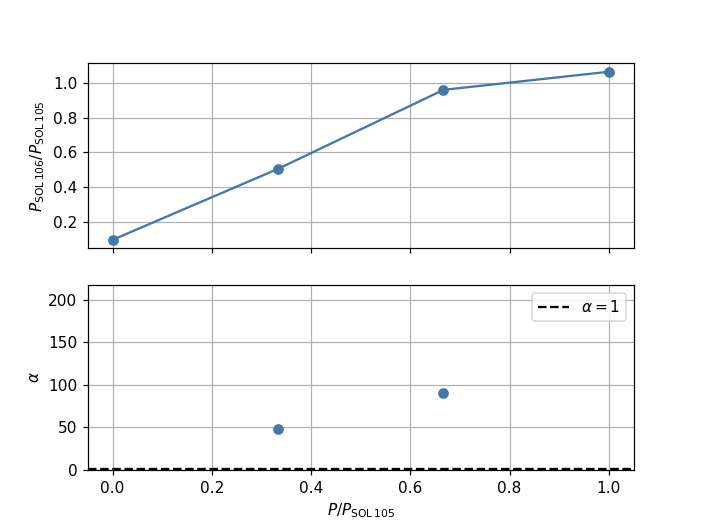

Applied load: 1 N
Nonlinear deformation:


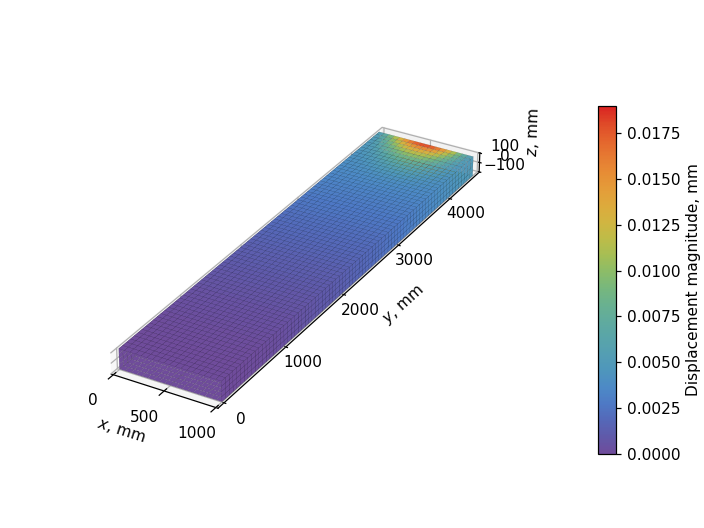

Predicted buckling load: 162 N
Buckling shape:


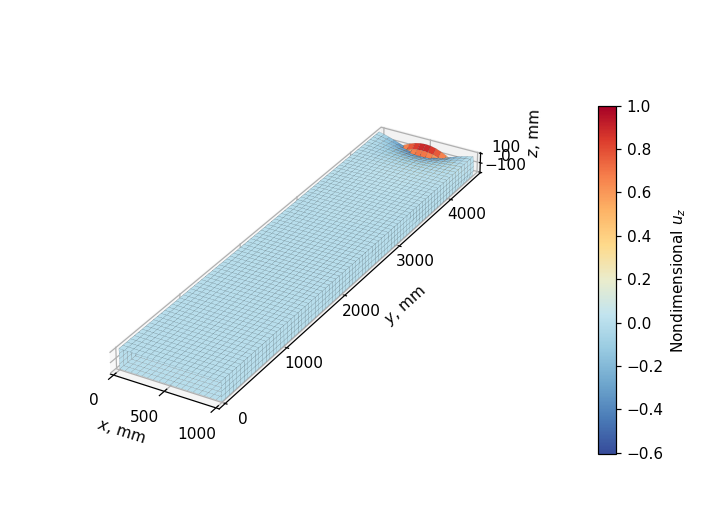

Applied load: 552 N
Nonlinear deformation:


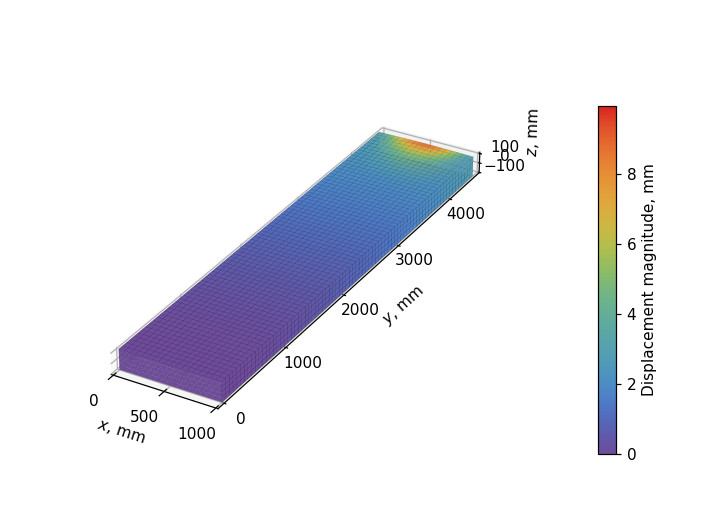

Predicted buckling load: 836 N
Buckling shape:


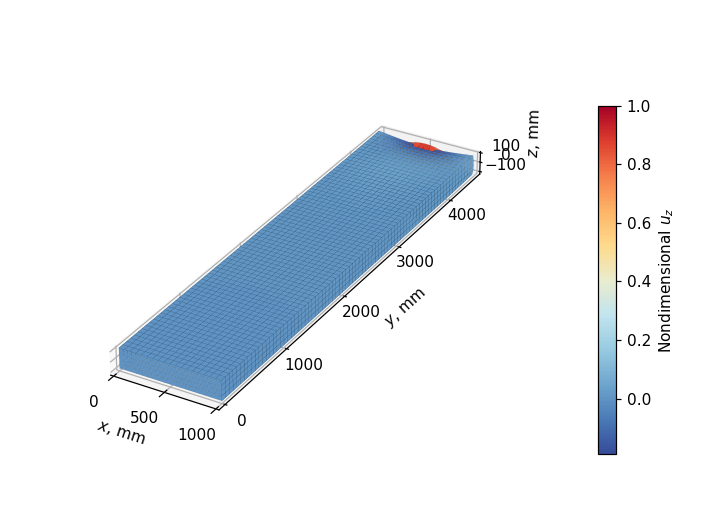

Applied load: 1103 N
Nonlinear deformation:


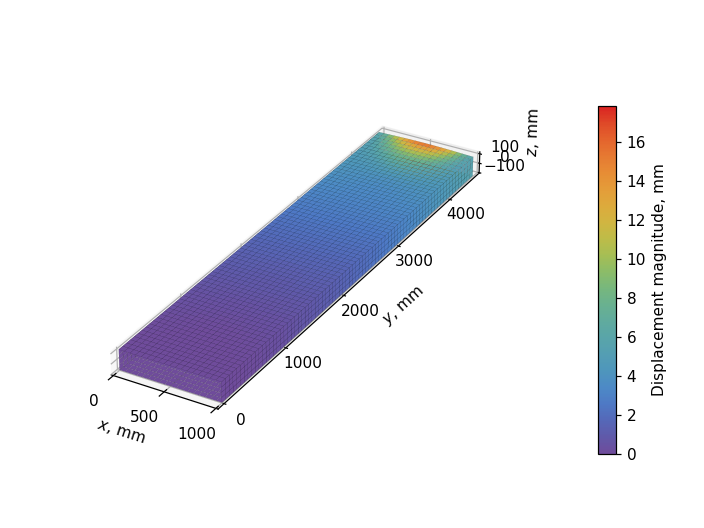

Predicted buckling load: 1586 N
Buckling shape:


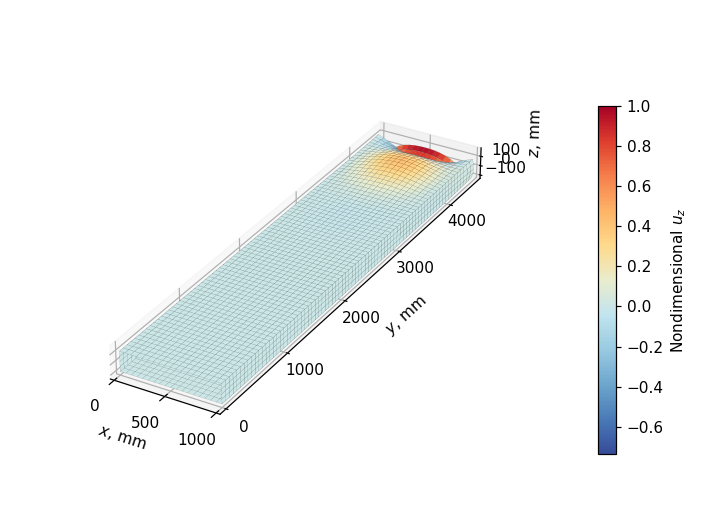

Applied load: 1654 N
Nonlinear deformation:


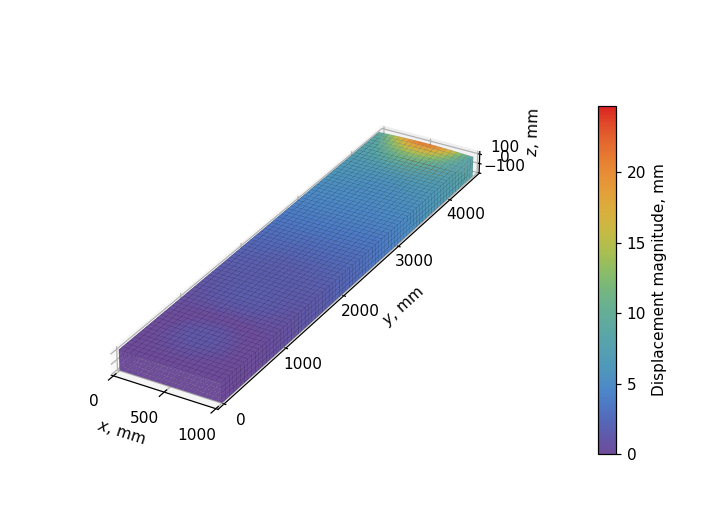

Predicted buckling load: 1758 N
Buckling shape:


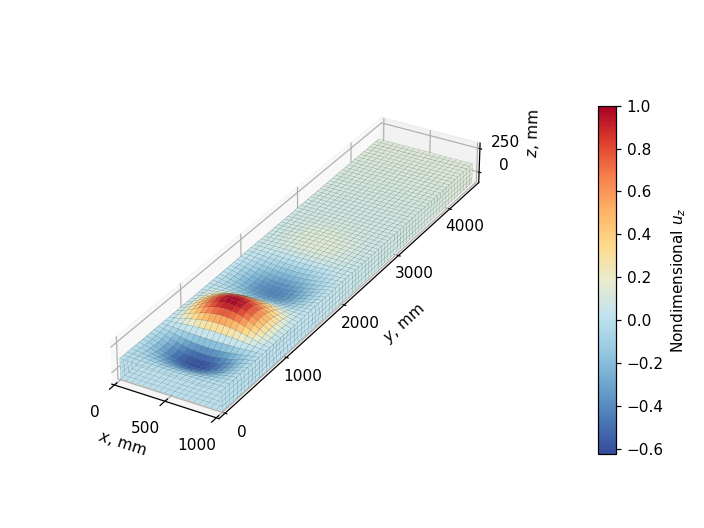

In [28]:
# Define magnitudes of applied load and print to screen
applied_load_magnitudes = np.linspace(1, linear_buckling_load, 4)
np.set_printoptions(precision=0, suppress=True)
print(f'Applied loads [N]: {applied_load_magnitudes}')

# Run analysis
input_name = 'concentrated_load_flexible_tip_nonlinear_buckling_method'
sol_106_op2 = run_nonlinear_buckling_method_sweep(concentrated_load_flexible_tip_input, applied_load_magnitudes, input_name, run_flag=False)

# Find nonlinear buckling loads and critical buckling factors
nonlinear_buckling_load_vectors, critical_buckling_factors = pynastran_utils.read_nonlinear_buckling_load_from_f06(
    f06_filepath=os.path.join(ANALYSIS_DIRECTORY_PATH, input_name + '.f06'), op2_object=sol_106_op2)  # read buckling loads and critical buckling factors from f06 file
nonlinear_buckling_loads = np.linalg.norm(np.sum(nonlinear_buckling_load_vectors[:, :, 0:3], axis=1), axis=1)  # calculate the norm of the nonlinear buckling load vector for each subcase

# Plot results
plot_buckling_loads(applied_load_magnitudes, linear_buckling_load, nonlinear_buckling_loads, critical_buckling_factors)

# Plot displacements and buckling shape for each subcase
valid_displacements_keys = [subcase_id for subcase_id in sol_106_op2.displacements if hasattr(sol_106_op2.displacements[subcase_id], 'lftsfqs')]  # find valid keys associated to the subcases
eigenvector_keys = [subcase_id for subcase_id in sol_106_op2.eigenvectors]  # find keys associated to the eigenvectors of the valid subcases
for count, applied_load in enumerate(applied_load_magnitudes):  # iterate through the prescribed load magnitudes (each corresponding to a different subcase)
    print(f'\033[1mApplied load: {applied_load:.0f} N\033[0m\nNonlinear deformation:')  # print info on the subcase
    plot_static_deformation(sol_106_op2, valid_displacements_keys[count])  # plot static deformation at the end of the subcase
    print(f'Predicted buckling load: {nonlinear_buckling_loads[count]:.0f} N\nBuckling shape:')
    plot_buckling_mode(sol_106_op2, eigenvector_keys[count])  # plot buckling shape predicted by nonlinear buckling method for the applied load of current subcase

Also for this investigation, the critical buckling factor is consistently above 1, even if by a smaller amount with respect to the previous cases. The buckling loads appear to be linearly dependent from the applied loads, except for the largest applied load, where the linearity seems to break. However, the predicted buckling loads do not show a clear convergence towards a certain value. Furthermore, the buckling load obtained with an applied load of 1 N is again the farthest value from the linear buckling load, which is in constrast with what we would expected.

The displacement field obtained from the nonlinear static analyses is once again similar for all load magnitudes. However, this time the displacement does not appear to be distributed all along the length of the box beam, rather it is concentrated in the region of the tip.

The effect of the locally-dominated nonlinear displacement field can be clearly seen on the buckling shape. In fact, the critical buckling mode is extremely localized at the tip of the box beam. Only for the case with the largest load magnitude, the buckling mode is similar to the one predicted by the linear analysis, so closer to a structure having a global beam-like behavior. This seems to confirm the fact that the local deformation at the tip of the box beam has a different influence on the nonlinear buckling prediction depending on the level of applied load.

### Rigid tip section  <a name="concentrated-load-rigid-tip"></a>
Finally, we want to test the concentrated load with a rigid tip section. Analogously to the previous cases, we generate a base `BDF` object, add a master node at the center of the tip section, add an RBE2 element to constrain the section and add a concentrated load at the master node with a FORCE card. We then calculate the linear buckling load with the associated mode.

subcase=0 already exists...skipping


Buckling load: 1654 N
Buckling mode:


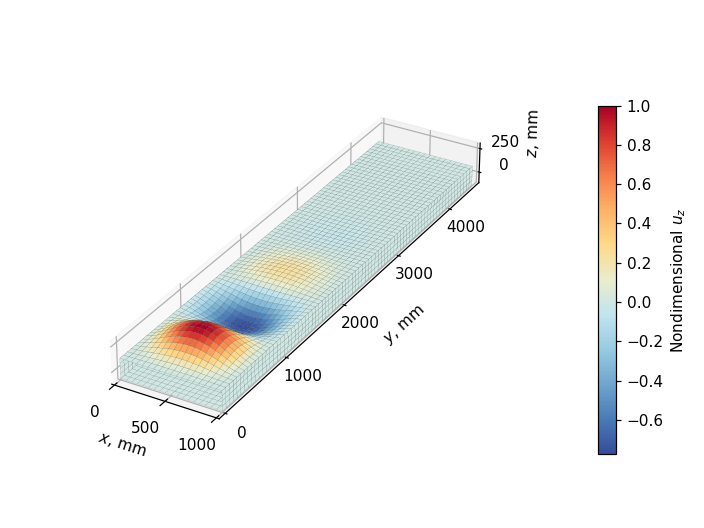

In [29]:
concentrated_load_rigid_tip_input = box_beam_utils.create_base_bdf_input(young_modulus=E, poisson_ratio=nu, density=rho, shell_thickness=t,
                                                                         nodes_xyz_array=nodes_coordinates_array,
                                                                         nodes_connectivity_matrix=nodes_connectivity_matrix)  # base BDF input
concentrated_load_rigid_tip_input.add_grid(master_node_id, [w/2, l, 0.])  # add master node of tip section
concentrated_load_rigid_tip_input.add_rbe2(rbe2_eid, master_node_id, '123456', tip_nodes_ids)  # add RBE2 element to make tip section rigid
concentrated_load_rigid_tip_input.add_force(sid=FORCE_SET_ID, node=master_node_id, mag=concentrated_force_magnitude,
                                            xyz=concentrated_force_direction)  # add concentrated force

# Run SOL 105 and return OP2 object
sol_105_op2 = pynastran_utils.run_sol_105_buckling_analysis(bdf_object=concentrated_load_rigid_tip_input.__deepcopy__({}),
                                                            static_load_set_id=FORCE_SET_ID, analysis_directory_path=ANALYSIS_DIRECTORY_PATH,
                                                            input_name='concentrated_load_rigid_tip_linear_buckling', run_flag=False)

# Find critical buckling load and print it
linear_buckling_load = sol_105_op2.eigenvectors[eigenvalue_calculation_subcase_id].eigr
print(f'Buckling load: {linear_buckling_load:.0f} N')

# Plot critical buckling mode
print(f'Buckling mode:')
plot_buckling_mode(sol_105_op2, eigenvalue_calculation_subcase_id)

Also in this case we do not notice any difference in terms of buckling load and shape with respect to the flexible tip configuration, as expected.

We now run our nonlinear analysis in an analogous way as for the previous cases.

Nastran job concentrated_load_rigid_tip_nonlinear_buckling_method.bdf completed
Wall time: 391.0 s


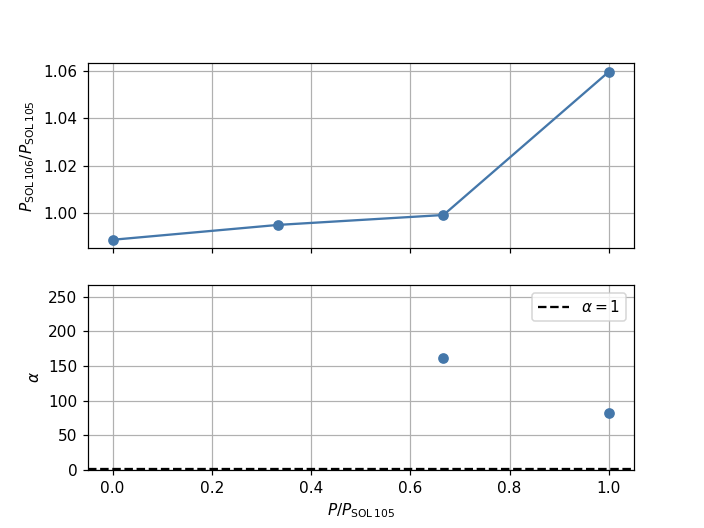

Applied load: 1 N
Nonlinear deformation:


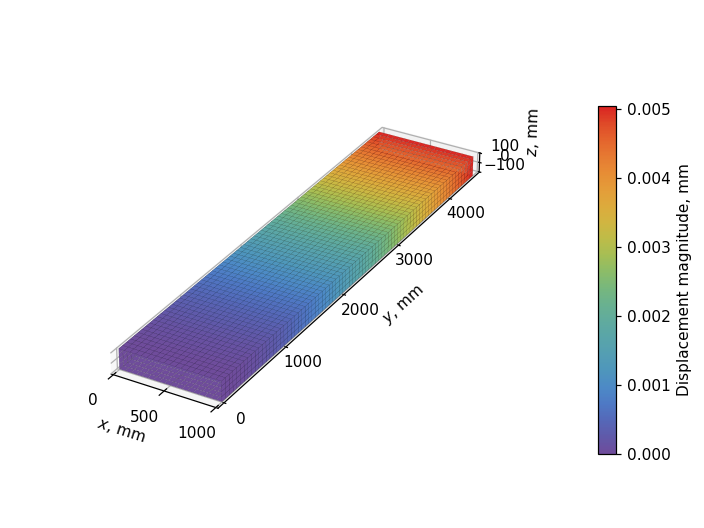

Predicted buckling load: 1636 N
Buckling shape:


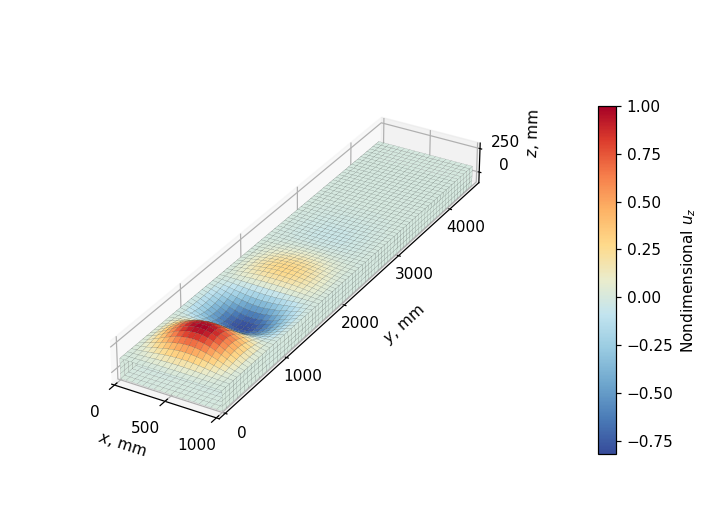

Applied load: 552 N
Nonlinear deformation:


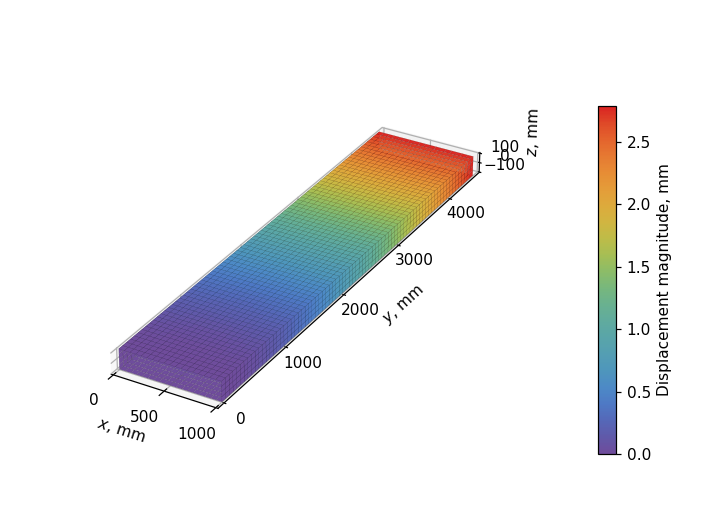

Predicted buckling load: 1646 N
Buckling shape:


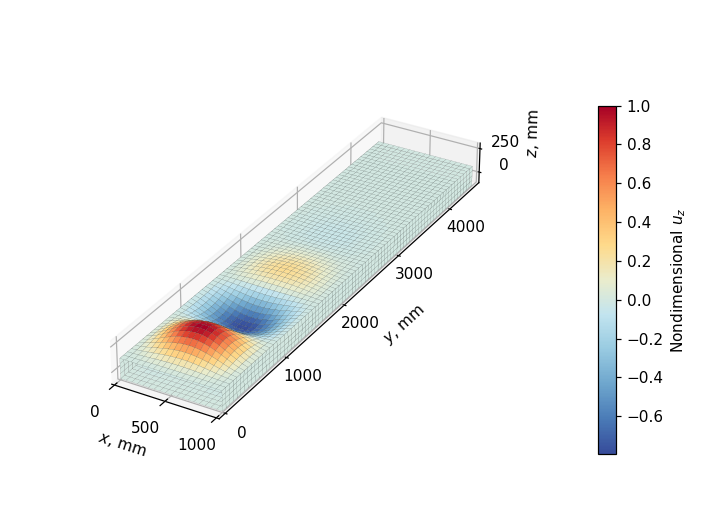

Applied load: 1103 N
Nonlinear deformation:


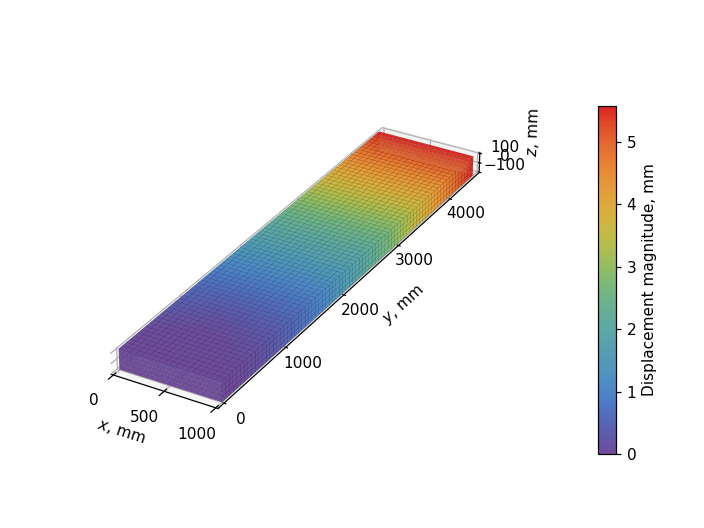

Predicted buckling load: 1653 N
Buckling shape:


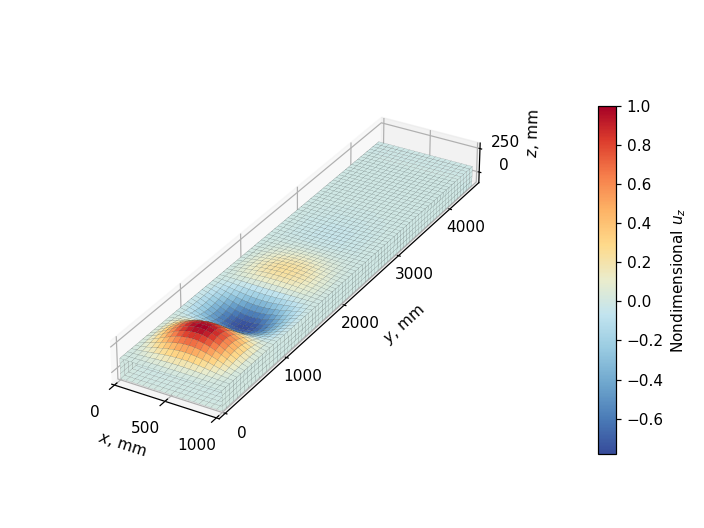

Applied load: 1654 N
Nonlinear deformation:


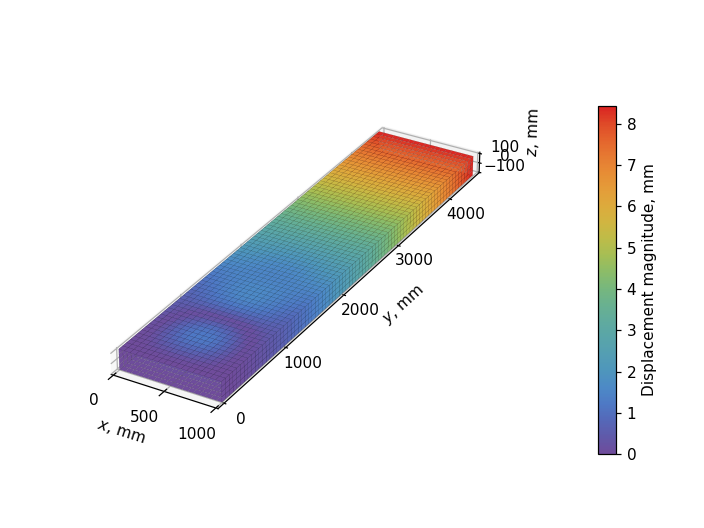

Predicted buckling load: 1753 N
Buckling shape:


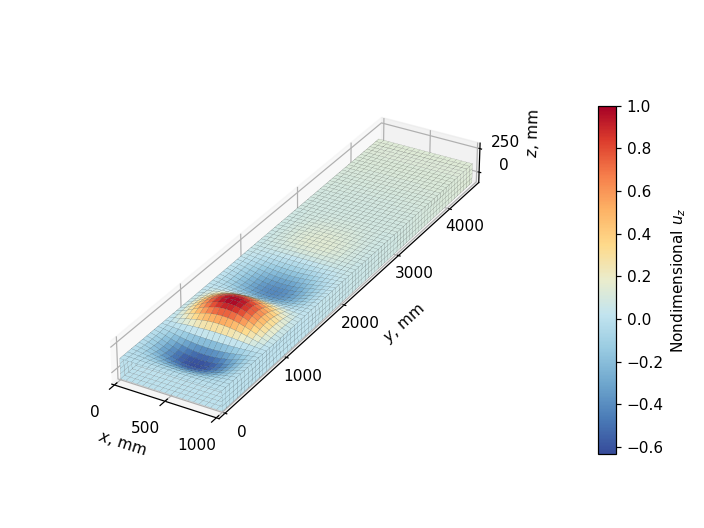

In [30]:
# Run nonlinear analysis
input_name = 'concentrated_load_rigid_tip_nonlinear_buckling_method'
sol_106_op2 = run_nonlinear_buckling_method_sweep(concentrated_load_rigid_tip_input, applied_load_magnitudes, input_name, run_flag=False)

# Find nonlinear buckling loads and critical buckling factors
nonlinear_buckling_load_vectors, critical_buckling_factors = pynastran_utils.read_nonlinear_buckling_load_from_f06(
    f06_filepath=os.path.join(ANALYSIS_DIRECTORY_PATH, input_name + '.f06'), op2_object=sol_106_op2)  # read buckling loads and critical buckling factors from f06 file
nonlinear_buckling_loads = np.linalg.norm(np.sum(nonlinear_buckling_load_vectors[:, :, 0:3], axis=1), axis=1)  # calculate the norm of the nonlinear buckling load vector for each subcase

# Plot results
plot_buckling_loads(applied_load_magnitudes, linear_buckling_load, nonlinear_buckling_loads, critical_buckling_factors)

# Plot displacements and buckling shape for each subcase
valid_displacements_keys = [subcase_id for subcase_id in sol_106_op2.displacements if hasattr(sol_106_op2.displacements[subcase_id], 'lftsfqs')]  # find valid keys associated to the subcases
eigenvector_keys = [subcase_id for subcase_id in sol_106_op2.eigenvectors]  # find keys associated to the eigenvectors of the valid subcases
for count, applied_load in enumerate(applied_load_magnitudes):  # iterate through the prescribed load magnitudes (each corresponding to a different subcase)
    print(f'\033[1mApplied load: {applied_load:.0f} N\033[0m\nNonlinear deformation:')  # print info on the subcase
    plot_static_deformation(sol_106_op2, valid_displacements_keys[count])  # plot static deformation at the end of the subcase
    print(f'Predicted buckling load: {nonlinear_buckling_loads[count]:.0f} N\nBuckling shape:')
    plot_buckling_mode(sol_106_op2, eigenvector_keys[count])  # plot buckling shape predicted by nonlinear buckling method for the applied load of current subcase

The critical buckling factor is once again consistently above 1. Similarly to the flexible configuration, the buckling loads appear to have a linear relationship with the applied loads except for the last applied load.

In terms of deformation and buckling shape, in this case we can observe a global beam-like behavior for both. The displacement field of the nonlinear deformation is distributed from the root to the tip of the box beam for all the applied loads. The buckling mode resembles closely the one predicted by the linear analysis for all applied loads. As far as the buckling loads are concerned, all values predicted by the nonlinear analysis are closer to the linear buckling load, compared to the previous cases, but also here there is no clear convergence to a certain value.

## Conclusions <a name="conclusions"></a>

***

All the investigated cases were characterized by the following features:
- critical buckling factor $\alpha$ consistently larger than 1;
- no convergence of the buckling load predicted by SOL 106's nonlinear buckling method for increasing applied loads;
- the buckling load predicted for a small applied load (1 N) is very far from the linear buckling prediction.

These results shed doubts on the use of Nastran's nonlinear buckling method to study the nonlinear buckling behavior of wing-like structures. The first follow-up step consists in making sure that the results obtained do not depend on the nonlinear analysis parameters employed here. For this reason, in our [next notebook](05_Sensitivity_Study_of_SOL_106_Nonlinear_Analysis_Parameters.ipynb) we will perform a sensitivity study on those parameters.